In [216]:
# Import Necessary Libraries
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay, RocCurveDisplay, PrecisionRecallDisplay, DetCurveDisplay
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import precision_score, recall_score, f1_score
from tensorflow.keras import layers, models, optimizers, callbacks, regularizers
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint
import os
import shutil
from glob import glob
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
import random
import matplotlib.image as mpimg
import pandas as pd
from ucimlrepo import fetch_ucirepo 
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE, SelectFromModel, mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
from sklearn.linear_model import LassoCV
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, cross_validate, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Wiscoin Dataset (CSV DATA)

In [9]:
!pip install ucimlrepo

In [10]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
breast_cancer_wisconsin_diagnostic = fetch_ucirepo(id=17) 
  
# data (as pandas dataframes) 
X = breast_cancer_wisconsin_diagnostic.data.features 
y = breast_cancer_wisconsin_diagnostic.data.targets 

In [11]:
print("Columns in the dataset")
X.columns

Columns in the dataset


Index(['radius1', 'texture1', 'perimeter1', 'area1', 'smoothness1',
       'compactness1', 'concavity1', 'concave_points1', 'symmetry1',
       'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2',
       'smoothness2', 'compactness2', 'concavity2', 'concave_points2',
       'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'perimeter3',
       'area3', 'smoothness3', 'compactness3', 'concavity3', 'concave_points3',
       'symmetry3', 'fractal_dimension3'],
      dtype='object')

In [12]:
print("First 5 observations")
X.head()

First 5 observations


,radius1,texture1,perimeter1,area1,smoothness1,compactness1,concavity1,concave_points1,symmetry1,fractal_dimension1,...,radius3,texture3,perimeter3,area3,smoothness3,compactness3,concavity3,concave_points3,symmetry3,fractal_dimension3
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [13]:
y.head()

,Diagnosis
0,M
1,M
2,M
3,M
4,M


In [235]:
# Assuming y is a numpy array
unique, counts = np.unique(y, return_counts=True)
count_dict = dict(zip(unique, counts))
print(f"Count of 0: {count_dict.get(0, 0)}")
print(f"Count of 1: {count_dict.get(1, 0)}")

Count of 0: 357
Count of 1: 212


In [223]:
X.shape

(569, 30)

## Pre-Processing

Checking for null values

In [243]:
# Check for missing values
print("Checking for missing values:")
print(X.isnull().sum())
print("\n")
print(y.isnull().sum())

Checking for missing values:
radius1               0
texture1              0
perimeter1            0
area1                 0
smoothness1           0
compactness1          0
concavity1            0
concave_points1       0
symmetry1             0
fractal_dimension1    0
radius2               0
texture2              0
perimeter2            0
area2                 0
smoothness2           0
compactness2          0
concavity2            0
concave_points2       0
symmetry2             0
fractal_dimension2    0
radius3               0
texture3              0
perimeter3            0
area3                 0
smoothness3           0
compactness3          0
concavity3            0
concave_points3       0
symmetry3             0
fractal_dimension3    0
dtype: int64


0


There are no null values present in both dependent and independent variables.

Encoding output variable

In [21]:
y = y['Diagnosis'].map({'M': 1,'B': 0})

### Feature Selection

Standardization for feature selection

In [24]:
# 1. Preprocessing - Standardization
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

We use the following feature selection methods to select the best features that contribute best in predicting the output.

- **Correlation** is fast and easy but limited to linear relationships.
- **RFE** works well for recursive elimination but can be slow on large datasets.
- **Random Forest** captures non-linear interactions.
- **Lasso** performs regularization and selects fewer but important features.
- **Mutual Information** captures non-linear dependencies not handled by traditional correlation metrics.

By combining these methods, we can ensure that we are capturing the most important features from various perspectives.

#### 1. Correlation

Measures how strongly each feature correlates with the target variable. High correlation indicates a potentially important feature.

In [30]:
# Compute Correlation with Target
correlation_with_target = pd.DataFrame(X).apply(lambda x: np.corrcoef(x, y)[0, 1])
print("Correlation with target (M or B):")
print(correlation_with_target)

Correlation with target (M or B):
radius1               0.730029
texture1              0.415185
perimeter1            0.742636
area1                 0.708984
smoothness1           0.358560
compactness1          0.596534
concavity1            0.696360
concave_points1       0.776614
symmetry1             0.330499
fractal_dimension1   -0.012838
radius2               0.567134
texture2             -0.008303
perimeter2            0.556141
area2                 0.548236
smoothness2          -0.067016
compactness2          0.292999
concavity2            0.253730
concave_points2       0.408042
symmetry2            -0.006522
fractal_dimension2    0.077972
radius3               0.776454
texture3              0.456903
perimeter3            0.782914
area3                 0.733825
smoothness3           0.421465
compactness3          0.590998
concavity3            0.659610
concave_points3       0.793566
symmetry3             0.416294
fractal_dimension3    0.323872
dtype: float64


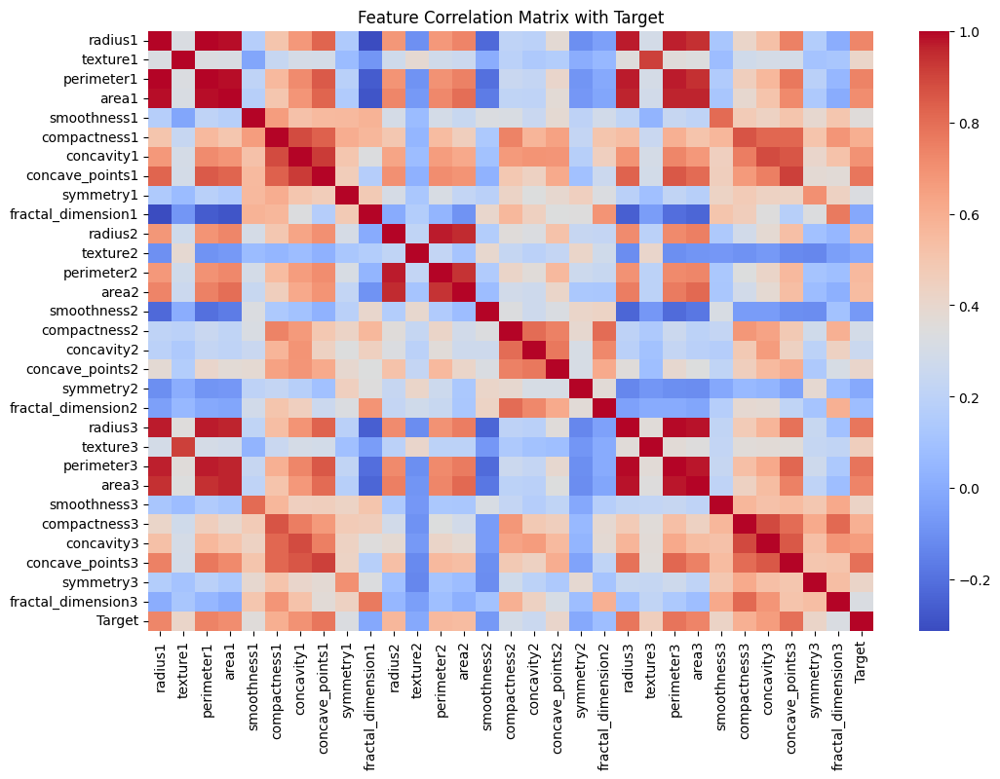

In [31]:
# Plotting the correlation matrix
plt.figure(figsize=(12, 8))
correlation_matrix = pd.DataFrame(X).assign(Target=y).corr()
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm')
plt.title("Feature Correlation Matrix with Target")
plt.show()

In [32]:
# Extract Best Correlated Features
threshold = 0.7
best_features_corr = correlation_with_target[abs(correlation_with_target) > threshold].index.tolist()
print(f"Best correlated features with the target (threshold = {threshold}): {best_features_corr}")

Best correlated features with the target (threshold = 0.7): ['radius1', 'perimeter1', 'area1', 'concave_points1', 'radius3', 'perimeter3', 'area3', 'concave_points3']


#### 2. Recursive Feature Elimination

RFE is a feature selection method that recursively removes the least important features based on the model's performance, allowing us to identify the most significant features for predicting the target variable.

In [35]:
estimator = RandomForestClassifier(random_state=42)
rfe_selector = RFE(estimator, n_features_to_select=8)
rfe_selector.fit(X_scaled, y)
best_features_rfe = X.columns[rfe_selector.support_]
print("RFE selected features:", best_features_rfe)

RFE selected features: Index(['perimeter1', 'area1', 'concave_points1', 'radius3', 'texture3',
       'perimeter3', 'area3', 'concave_points3'],
      dtype='object')


#### 3. Feature Importance from Random Forest

The Random Forest classifier is trained on the scaled feature set, and the importance of each feature is evaluated based on its contribution to reducing impurity in the trees. The top 10 features with the highest importance scores are selected for further analysis and model training.

In [38]:
# Feature Importance from Random Forest
forest = RandomForestClassifier(random_state=42)
forest.fit(X_scaled, y)
importances = forest.feature_importances_
best_features_forest = X.columns[np.argsort(importances)[-8:]]  # Top 10 features
print("Random Forest selected features:", best_features_forest)

Random Forest selected features: Index(['area1', 'concavity1', 'perimeter1', 'perimeter3', 'radius3',
       'concave_points1', 'concave_points3', 'area3'],
      dtype='object')


#### 4. Lasso Feature Selection

Lasso (L1 Regularization) identifies important features by penalizing the absolute size of coefficients, effectively shrinking some to zero. This allows for automatic feature selection, retaining only those features that contribute significantly to the model's predictive power.

In [41]:
# Lasso (L1 Regularization)
lasso = LassoCV(cv=5, max_iter=10000).fit(X_scaled, y)
best_features_lasso = X.columns[lasso.coef_ != 0]  # Features with non-zero coefficients
print("Lasso selected features:", best_features_lasso)

Lasso selected features: Index(['texture1', 'area1', 'compactness1', 'concavity1', 'concave_points1',
       'fractal_dimension1', 'radius2', 'texture2', 'perimeter2', 'area2',
       'smoothness2', 'compactness2', 'concavity2', 'concave_points2',
       'symmetry2', 'fractal_dimension2', 'radius3', 'texture3', 'area3',
       'smoothness3', 'concavity3', 'concave_points3', 'symmetry3',
       'fractal_dimension3'],
      dtype='object')


#### Mutual Inforamtion

Detects non-linear relationships between the features and the target.

In [44]:
# 6. Mutual Information
mutual_info = mutual_info_classif(X_scaled, y)
best_features_mutual_info = X.columns[np.argsort(mutual_info)[-8:]]  # Top 10 features
print("Mutual Information selected features:", best_features_mutual_info)

Mutual Information selected features: Index(['radius1', 'concavity1', 'perimeter1', 'concave_points3',
       'concave_points1', 'radius3', 'area3', 'perimeter3'],
      dtype='object')


#### Combine the Results

The combined selected features from different methods give a more comprehensive set of important features.

In [47]:
# Summarizing all selected features
selected_features = set(best_features_corr) | set(best_features_rfe) | set(best_features_forest) | set(best_features_mutual_info)
print("\nCombined selected features from all methods:", selected_features)


Combined selected features from all methods: {'radius3', 'concave_points1', 'area3', 'concave_points3', 'perimeter3', 'perimeter1', 'area1', 'radius1', 'concavity1', 'texture3'}


## Models

Initialize a dataframe to store the performance metrices of each model, for model comparison later.

In [50]:
# Initialize the metrics DataFrame
metrics_data = {
    'Model': [],
    'Abb': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1-Score': [],
    'AUC-ROC': []
}
metrics_df = pd.DataFrame(metrics_data)

# Introduce a function to append performance metrics
def append_metrics(model_name, abbrevation, accuracy, precision, recall, f1, roc_auc):
    """
    This function can be used to append the performance metric dataframe for each model that is being trained.
    """
    global metrics_df
    new_row = pd.DataFrame({
        'Model': [model_name],
        'Abb': [abbrevation],
        'Accuracy': [accuracy],
        'Precision': [precision],
        'Recall': [recall],
        'F1-Score': [f1],
        'AUC-ROC': [roc_auc]
    })
    metrics_df = pd.concat([metrics_df, new_row], ignore_index=True)

### Model 1 - Logistic Regression

Import necessary libraries for fitting a logistic regression model.

Split the dataset into train, evaluation and test set. Train the model with the training dataset, find the prediction metrices (viz. accuracy, precision, recall, F1 - Score) and tune the hyper parameters using the evaluation dataset. Finally, test the model performance using the test data.

In [54]:
# 1. Train-Test-Eval Split (60% train, 20% eval, 20% test)
selected_features = list(selected_features) # Convert from set to a list for usage
X_train_eval, X_test, y_train_eval, y_test = train_test_split(X[selected_features], y, test_size=0.2, random_state=42, stratify=y)
X_train, X_eval, y_train, y_eval = train_test_split(X_train_eval, y_train_eval, test_size=0.25, random_state=42, stratify=y_train_eval)

In [55]:
# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_eval_scaled = scaler.transform(X_eval)

#### Type 2

Define the logistic regression model

In [58]:
# Define the model
log_reg = LogisticRegression()

# Create StratifiedKFold object for k-fold cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

In [59]:
# Hyperparameter grid for tuning
param_grid = {
    'penalty': ['l2'],
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear', 'lbfgs']
}

# Scorers for metrics
scorers = {
    'accuracy': make_scorer(accuracy_score),
    'precision': make_scorer(precision_score),
    'recall': make_scorer(recall_score),
    'f1': make_scorer(f1_score),
    'roc_auc': make_scorer(roc_auc_score)
}

Hyperparameter tuning and performing K-Fold cross validation.

In [61]:
# Grid Search with Cross-Validation
grid_search = GridSearchCV(log_reg, param_grid, scoring='accuracy', cv=cv, return_train_score=True)
grid_search.fit(X_train_scaled, y_train)

# Results from Grid Search
print("Best parameters:", grid_search.best_params_)
print("Best score (Accuracy):", grid_search.best_score_)

Best parameters: {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}
Best score (Accuracy): 0.9765984654731458


In [62]:
# Calculate metrics for the best estimator
y_pred_eval = grid_search.predict(X_eval_scaled)
accuracy_log = accuracy_score(y_eval, y_pred_eval)
precision_log = precision_score(y_eval, y_pred_eval)
recall_log = recall_score(y_eval, y_pred_eval)
f1_log = f1_score(y_eval, y_pred_eval)
roc_auc_log = roc_auc_score(y_eval, y_pred_eval)

print(f"\nEvaluation Metrics for Logistic Regression:\nAccuracy: {accuracy_log:.4f}\nPrecision: {precision_log:.4f}\nRecall: {recall_log:.4f}\nF1-Score: {f1_log:.4f}\nAUC-ROC: {roc_auc_log:.4f}")


Evaluation Metrics for Logistic Regression:
Accuracy: 0.9649
Precision: 0.9535
Recall: 0.9535
F1-Score: 0.9535
AUC-ROC: 0.9627


In [63]:
# Append the performance metric dataframe
append_metrics('Logistic Regression', 'lr', accuracy_log, precision_log, recall_log, f1_log, roc_auc_log)

### Model 2 - Random Forest

In [65]:
# Define the model
rf = RandomForestClassifier(random_state=42)

In [66]:
# Hyperparameter grid for tuning
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]
}

# Grid Search with Cross-Validation
grid_search_rf = GridSearchCV(rf, param_grid, scoring='accuracy', cv=cv, return_train_score=True)
grid_search_rf.fit(X_train, y_train)

# Results from Grid Search
print("Best parameters:", grid_search_rf.best_params_)
print("Best score (Accuracy):", grid_search_rf.best_score_)

Best parameters: {'max_depth': None, 'min_samples_split': 5, 'n_estimators': 50}
Best score (Accuracy): 0.9531543052003411


In [67]:
# Calculate metrics for the best estimator
y_pred_eval_rf = grid_search_rf.predict(X_eval)
accuracy_rf = accuracy_score(y_eval, y_pred_eval_rf)
precision_rf = precision_score(y_eval, y_pred_eval_rf)
recall_rf = recall_score(y_eval, y_pred_eval_rf)
f1_rf = f1_score(y_eval, y_pred_eval_rf)
roc_auc_rf = roc_auc_score(y_eval, y_pred_eval_rf)

print(f"\nEvaluation Metrics for Random Forest:\nAccuracy: {accuracy_rf:.4f}\nPrecision: {precision_rf:.4f}\nRecall: {recall_rf:.4f}\nF1-Score: {f1_rf:.4f}\nAUC-ROC: {roc_auc_rf:.4f}")


Evaluation Metrics for Random Forest:
Accuracy: 0.9737
Precision: 0.9762
Recall: 0.9535
F1-Score: 0.9647
AUC-ROC: 0.9697


In [68]:
# Append the performance metric dataframe
append_metrics('Random Forest', 'rf', accuracy_rf, precision_rf, recall_rf, f1_rf, roc_auc_rf)

### Model 4 - XGBoost

In [70]:
# Define the model
xgb = XGBClassifier(random_state=42, eval_metric='logloss')

In [71]:
# Hyperparameter grid for tuning
param_dist = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0]
}

# Random Search with Cross-Validation
# grid_search = GridSearchCV(log_reg, param_grid, scoring='accuracy', cv=cv, return_train_score=True)
random_search_xgb = RandomizedSearchCV(xgb, param_dist, scoring='accuracy', cv=cv, return_train_score=True)
random_search_xgb.fit(X_train, y_train)

# Results from Random Search
print("Best parameters:", random_search_xgb.best_params_)
print("Best score (Accuracy):", random_search_xgb.best_score_)

Best parameters: {'subsample': 1.0, 'n_estimators': 100, 'max_depth': 7, 'learning_rate': 0.2}
Best score (Accuracy): 0.9707587382779199


In [72]:
# Calculate metrics for the best estimator
y_pred_eval = random_search_xgb.predict(X_eval)
accuracy_xgb = accuracy_score(y_eval, y_pred_eval)
precision_xgb = precision_score(y_eval, y_pred_eval)
recall_xgb = recall_score(y_eval, y_pred_eval)
f1_xgb = f1_score(y_eval, y_pred_eval)
roc_auc_xgb = roc_auc_score(y_eval, y_pred_eval)

print(f"\nEvaluation Metrics for XGBoost:\nAccuracy: {accuracy_xgb:.4f}\nPrecision: {precision_xgb:.4f}\nRecall: {recall_xgb:.4f}\nF1-Score: {f1_xgb:.4f}\nAUC-ROC: {roc_auc_xgb:.4f}")


Evaluation Metrics for XGBoost:
Accuracy: 0.9474
Precision: 0.9111
Recall: 0.9535
F1-Score: 0.9318
AUC-ROC: 0.9486


In [73]:
# Append the performance metric dataframe
append_metrics('XGBoost', 'xgb', accuracy_xgb, precision_xgb, recall_xgb, f1_xgb, roc_auc_xgb)

### Model 5 - Gradient Boosting

In [95]:
# Define the model
gb = GradientBoostingClassifier(random_state=42)

In [97]:
# Hyperparameter grid for tuning
param_grid_gb = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}

# Grid Search with Cross-Validation
grid_search_gb = GridSearchCV(gb, param_grid_gb, scoring='accuracy', cv=cv, return_train_score=True)
grid_search_gb.fit(X_train, y_train)

# Results from Grid Search
print("Best parameters:", grid_search_gb.best_params_)
print("Best score (Accuracy):", grid_search_gb.best_score_)

Best parameters: {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 300}
Best score (Accuracy): 0.9736572890025575


In [98]:
# Calculate metrics for the best estimator
y_pred_eval_gb = grid_search_gb.predict(X_eval)
accuracy_gb = accuracy_score(y_eval, y_pred_eval_gb)
precision_gb = precision_score(y_eval, y_pred_eval_gb)
recall_gb = recall_score(y_eval, y_pred_eval_gb)
f1_gb = f1_score(y_eval, y_pred_eval_gb)
roc_auc_gb = roc_auc_score(y_eval, y_pred_eval_gb)

print(f"\nEvaluation Metrics for Gradient Boosting\nAccuracy: {accuracy_gb:.4f}\nPrecision: {precision_gb:.4f}\nRecall: {recall_gb:.4f}\nF1-Score: {f1_gb:.4f}\nAUC-ROC: {roc_auc_gb:.4f}")


Evaluation Metrics for Gradient Boosting
Accuracy: 0.9474
Precision: 0.9302
Recall: 0.9302
F1-Score: 0.9302
AUC-ROC: 0.9440


In [99]:
# Append the performance metric dataframe
append_metrics('Gradient Boosting', 'gb', accuracy_gb, precision_gb, recall_gb, f1_gb, roc_auc_gb)

### Model 6 - K-Nearest Neighbours

In [101]:
from sklearn.neighbors import KNeighborsClassifier

# Define the model
knn = KNeighborsClassifier()

In [102]:
# Hyperparameter grid for tuning
param_grid_knn = {
    'n_neighbors': [3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

# Grid Search with Cross-Validation
grid_search_knn = GridSearchCV(knn, param_grid_knn, scoring='accuracy', cv=cv, return_train_score=True, verbose=1)
grid_search_knn.fit(X_train, y_train)

# Results from Grid Search
print("Best parameters:", grid_search_knn.best_params_)
print("Best score (Accuracy):", grid_search_knn.best_score_)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
Best parameters: {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'uniform'}
Best score (Accuracy): 0.9296675191815857


In [103]:
# Calculate metrics for the best estimator
y_pred_eval_knn = grid_search_knn.predict(X_eval)
accuracy_knn = accuracy_score(y_eval, y_pred_eval_knn)
precision_knn = precision_score(y_eval, y_pred_eval_knn)
recall_knn = recall_score(y_eval, y_pred_eval_knn)
f1_knn = f1_score(y_eval, y_pred_eval_knn)
roc_auc_knn = roc_auc_score(y_eval, y_pred_eval_knn)

print(f"\nEvaluation Metrics for KNN:\nAccuracy: {accuracy_knn:.4f}\nPrecision: {precision_knn:.4f}\nRecall: {recall_knn:.4f}\nF1-Score: {f1_knn:.4f}\nAUC-ROC: {roc_auc_knn:.4f}")


Evaluation Metrics for KNN:
Accuracy: 0.9474
Precision: 0.9512
Recall: 0.9070
F1-Score: 0.9286
AUC-ROC: 0.9394


In [104]:
# Append the performance metric dataframe
append_metrics('K-Nearest Neighbours', 'knn', accuracy_knn, precision_knn, recall_knn, f1_knn, roc_auc_knn)

### Model 7 - Naive Bayes

Naive Bayes typically does not have many hyperparameters to tune. In Gaussian Naive Bayes, the key assumption is that features are normally distributed, and there aren’t many parameters like C in SVM or n_estimators in Random Forest.

In [107]:
# Define the model
nb_model = GaussianNB()

# Train the model with the entire training set
nb_model.fit(X_train, y_train)

# Make predictions on evaluation data
y_pred_eval_nb = nb_model.predict(X_eval)

# Calculate metrics for evaluation
accuracy_nb = accuracy_score(y_eval, y_pred_eval_nb)
precision_nb = precision_score(y_eval, y_pred_eval_nb)
recall_nb = recall_score(y_eval, y_pred_eval_nb)
f1_nb = f1_score(y_eval, y_pred_eval_nb)
roc_auc_nb = roc_auc_score(y_eval, y_pred_eval_nb)

# Display the performance metrics
print(f"\nEvaluation Metrics for Naive Bayes:\nAccuracy: {accuracy_nb:.4f}\nPrecision: {precision_nb:.4f}\nRecall: {recall_nb:.4f}\nF1-Score: {f1_nb:.4f}\nAUC-ROC: {roc_auc_nb:.4f}")


Evaluation Metrics for Naive Bayes:
Accuracy: 0.9474
Precision: 0.9512
Recall: 0.9070
F1-Score: 0.9286
AUC-ROC: 0.9394


In [108]:
# Append the performance metric dataframe
append_metrics('Naive Bayes', 'nb', accuracy_nb, precision_nb, recall_nb, f1_nb, roc_auc_nb)

### Model 8 - Stochastic Gradient Descent (SGD)

In [110]:
# Define the model
sgd_model = SGDClassifier(random_state=42)

`SGDClassifier` finds it difficult to converge, which indicates that the optimization is struggling to minimise the loss function. Hence introducing `early_stopping` criteria, which stops the training if the validation set does not imporve for several consecutive iterations, which inturn prevents overfitting.

In [112]:
# Hyperparameter tuning for SGD model
param_grid_sgd = {
    # Loss function to be minimized
        # 1. hinge: linear SVM loss function
        # 2. log_loss: logistic regression loss function
        # 3. modified_huber: Smooth combination of both hinge and log_loss which is less sensitive to outliers
        # 4. square_hinge: loss function which is more sensitive to outliers
    'loss': ['hinge', 'log_loss', 'modified_huber', 'squared_hinge', 'perceptron'],
    # Penalises model complexity reducing overfitting
        # 1. 'l1': L1 regularization (Lasso), leads to sparse solutions (some weights are zero).
        # '2. l2': L2 regularization (Ridge), penalizes large weights, favoring smaller weights.
        # 3. 'elasticnet': Combination of L1 and L2 regularization, balancing between the two.
    'penalty': ['l2', 'l1', 'elasticnet'],
    'alpha': [0.0001, 0.001, 0.01], # Regularization parameter
    'learning_rate': ['constant', 'optimal', 'invscaling', 'adaptive'], # how model adjusts its parameters in each iterations
    'early_stopping': [True],  # Enable early stopping
    'n_iter_no_change': [5, 10],  # Number of iterations with no improvement for early stopping
    'eta0': [0.01, 0.001, 0.0001],  # Initial learning rate (>0)
    'tol': [1e-3, 1e-4] # Model halts training if improvement in loss is smaller than tolerance.
}

In [113]:
# Grid Search with Cross-Validation
grid_search_sgd = GridSearchCV(sgd_model, param_grid_sgd, scoring='accuracy', cv=cv, return_train_score=True)
grid_search_sgd.fit(X_train, y_train)

# Results from Grid Search
print("Best parameters:", grid_search_sgd.best_params_)
print("Best score (Accuracy):", grid_search_sgd.best_score_)

Best parameters: {'alpha': 0.01, 'early_stopping': True, 'eta0': 0.01, 'learning_rate': 'constant', 'loss': 'squared_hinge', 'n_iter_no_change': 10, 'penalty': 'elasticnet', 'tol': 0.001}
Best score (Accuracy): 0.9327365728900257


In [114]:
# Train the best model found by GridSearchCV
best_sgd = grid_search_sgd.best_estimator_

# Perform predictions on evaluation data
y_pred_eval_sgd = best_sgd.predict(X_eval)

# Calculate performance metrics on evaluation data
accuracy_sgd = accuracy_score(y_eval, y_pred_eval_sgd)
precision_sgd = precision_score(y_eval, y_pred_eval_sgd)
recall_sgd = recall_score(y_eval, y_pred_eval_sgd)
f1_sgd = f1_score(y_eval, y_pred_eval_sgd)
roc_auc_sgd = roc_auc_score(y_eval, y_pred_eval_sgd)

# Display the performance metrics
print(f"\nEvaluation Metrics for Stochastic Gradient Descent:\nAccuracy: {accuracy_sgd:.4f}\nPrecision: {precision_sgd:.4f}\nRecall: {recall_sgd:.4f}\nF1-Score: {f1_sgd:.4f}\nAUC-ROC: {roc_auc_sgd:.4f}")


Evaluation Metrics for Stochastic Gradient Descent:
Accuracy: 0.9123
Precision: 0.9231
Recall: 0.8372
F1-Score: 0.8780
AUC-ROC: 0.8975


In [115]:
# Append the performance metric dataframe
append_metrics('Stochastic Gradient Descent', 'sgd', accuracy_sgd, precision_sgd, recall_sgd, f1_sgd, roc_auc_sgd)

### Model 9 - Decision Tree

In [237]:
# Define the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)

In [239]:
# Hyperparameter grid for tuning
param_grid_dt = {
    'criterion': ['gini', 'entropy'],        # Split criterion
    'max_depth': [None, 10, 20, 30],         # Depth of the tree
    'min_samples_split': [2, 10, 20],        # Minimum samples required to split a node
    'min_samples_leaf': [1, 5, 10],          # Minimum samples required in a leaf node
    'max_features': [None, 'sqrt', 'log2']  # Number of features to consider for split
}

# Grid Search with Cross-Validation
grid_search_dt = GridSearchCV(dt_model, param_grid_dt, scoring='accuracy', cv=5, return_train_score=True)
grid_search_dt.fit(X_train, y_train)

# Results from Grid Search
print("Best parameters:", grid_search_dt.best_params_)
print("Best score (Accuracy):", grid_search_dt.best_score_)

Best parameters: {'criterion': 'entropy', 'max_depth': None, 'max_features': None, 'min_samples_leaf': 5, 'min_samples_split': 2}
Best score (Accuracy): 0.9442881500426257


In [241]:
# Train the best model found by GridSearchCV
best_dt = grid_search_dt.best_estimator_

# Perform predictions on evaluation data
y_pred_eval_dt = best_dt.predict(X_eval)

# Calculate performance metrics on evaluation data
accuracy_dt = accuracy_score(y_eval, y_pred_eval_dt)
precision_dt = precision_score(y_eval, y_pred_eval_dt)
recall_dt = recall_score(y_eval, y_pred_eval_dt)
f1_dt = f1_score(y_eval, y_pred_eval_dt)
roc_auc_dt = roc_auc_score(y_eval, y_pred_eval_dt)

# Display the performance metrics
print(f"\nEvaluation Metrics for Decision Tree:\nAccuracy: {accuracy_dt:.4f}\nPrecision: {precision_dt:.4f}\nRecall: {recall_dt:.4f}\nF1-Score: {f1_dt:.4f}\nAUC-ROC: {roc_auc_dt:.4f}")


Evaluation Metrics for Decision Tree:
Accuracy: 0.9474
Precision: 0.9302
Recall: 0.9302
F1-Score: 0.9302
AUC-ROC: 0.9440


In [124]:
# Append the performance metric dataframe
append_metrics('Decision Tree', 'dt', accuracy_dt, precision_dt, recall_dt, f1_dt, roc_auc_dt)

## Compare Each Models and Select the Best One

## Round all metrics to 4 decimal places
metrics_df.iloc[:, 1:] = metrics_df.iloc[:, 1:].round(4)

# Printing the metrices dataframe
metrics_df

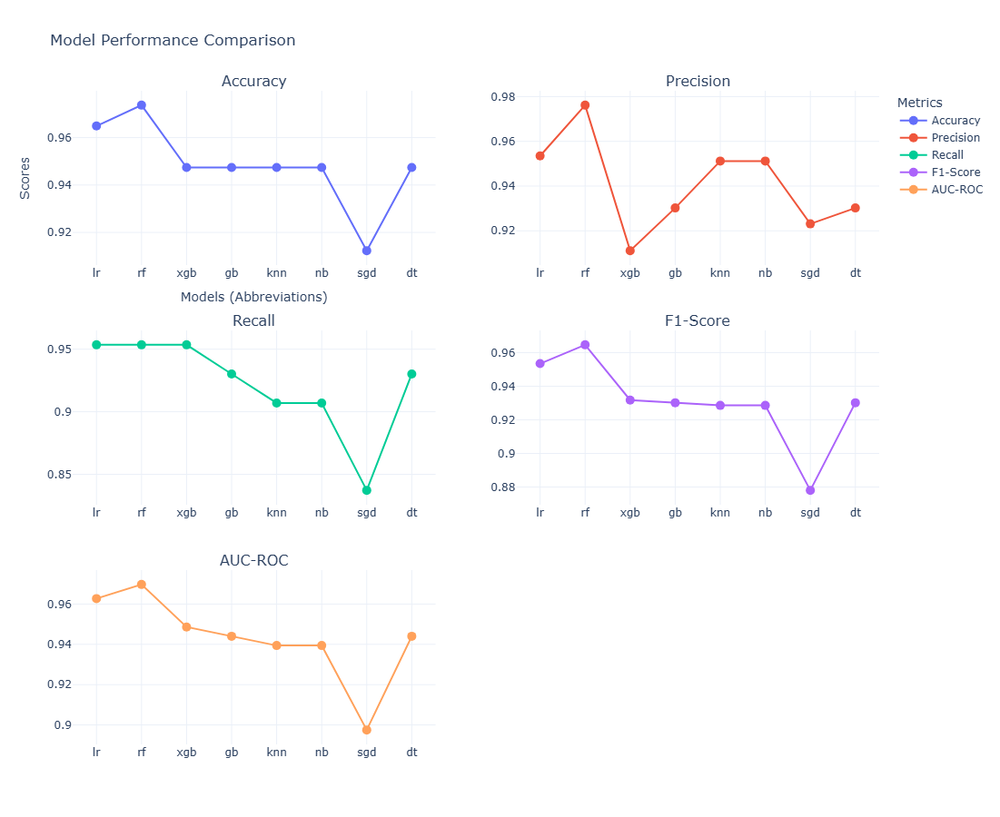

In [142]:
# Create subplots for each metric
fig = make_subplots(rows=3, cols=2, subplot_titles=metrics_df.columns[2:], 
                    vertical_spacing=0.1)

# Add traces for each metric
for i, metric in enumerate(metrics_df.columns[2:]):
    row = i // 2 + 1  # Determine the row number
    col = i % 2 + 1   # Determine the column number
    fig.add_trace(go.Scatter(
        x=metrics_df['Abb'],
        y=metrics_df[metric],
        mode='lines+markers',
        name=metric,
        text=metrics_df.apply(lambda row: f"{row['Model']}: {row[metric]}", axis=1),  # Show model names and metric value on hover
        hoverinfo='text',
        marker=dict(size=10),
    ), row=row, col=col)

# Update layout
fig.update_layout(
    title='Model Performance Comparison',
    xaxis_title='Models (Abbreviations)',
    yaxis_title='Scores',
    legend_title='Metrics',
    height=900,
    template='plotly_white'
)

# Show the plot
fig.show()

Based on the condition of medical fields, it is vital to reduce the number of false positive (benign falsely predicetd as malignant) and false negative (malignant falsely predicted as benign), as this might have significant consequences in patient care and tretement decision. So the model should be having high precision (high precision means if the model predicts malignant, it is likely to be correct) and high recall (High recall ensures that most malignant cases are correctly identified, which is critical for patient safety).

- Precision: Random Forest (0.9737) and Decision Tree (0.9756) have better values compared to other models. 
- Recall: The recall of Random Forest (0.9535) is higher compared to that of Decision Tree(0.9302).
- F1-Score: Similarly, the F1-Score of Random forest (0.9647) is higher than that of Decision Tree (0.9524).

Based on the priority of minimizing false negatives while maintaining a high precision rate, the Random Forest model appears to be the best option, as it offers a strong balance of recall and precision. This makes it particularly suitable for a medical context where both false negatives and false positives carry significant consequences.

## Testing the best perfroming model (Random Forest)

Generalizing the best performing model for the Wiscoin Breast Cancer Dataset i.e., the Random Forest Model with the parameters: 
- `best_rf = RandomForestClassifier(max_depth=None, min_samples_split=5, n_estimators=50)` <br>

After training the best model in the entire `X_train_eval` dataset and predicting the output of an unseen test dataset (`X_test`). The resulting performace metrices are recorded.

In [158]:
# Use the best parameters to create the final model
best_rf = RandomForestClassifier(
    max_depth=None,
    min_samples_split=5,
    n_estimators=50,
    random_state=42
)

# Fit the model on the entire training and evaluation dataset
best_rf.fit(X_train_eval, y_train_eval)

# Make predictions on the test set
y_test_pred = best_rf.predict(X_test)

# Calculate performance metrics
accuracy_test = accuracy_score(y_test, y_test_pred)
precision_test = precision_score(y_test, y_test_pred)
recall_test = recall_score(y_test, y_test_pred)
f1_test = f1_score(y_test, y_test_pred)
roc_auc_test = roc_auc_score(y_test, best_rf.predict_proba(X_test)[:, 1])

# Print the results
print(f"Test Set Evaluation Metrics for Random Forest:\n")
print(f"Accuracy: {accuracy_test:.4f}")
print(f"Precision: {precision_test:.4f}")
print(f"Recall: {recall_test:.4f}")
print(f"F1-Score: {f1_test:.4f}")
print(f"AUC-ROC: {roc_auc_test:.4f}\n")

Test Set Evaluation Metrics for Random Forest:

Accuracy: 0.9737
Precision: 1.0000
Recall: 0.9286
F1-Score: 0.9630
AUC-ROC: 0.9957



In [160]:
# Detailed classification report
print("Classification Report:\n")
print(classification_report(y_test, y_test_pred))

Classification Report:

              precision    recall  f1-score   support

           0       0.96      1.00      0.98        72
           1       1.00      0.93      0.96        42

    accuracy                           0.97       114
   macro avg       0.98      0.96      0.97       114
weighted avg       0.97      0.97      0.97       114



In [162]:
# Confusion matrix
print("Confusion Matrix:\n")
print(confusion_matrix(y_test, y_test_pred))

Confusion Matrix:

[[72  0]
 [ 3 39]]


### Confusion Matrix Heatmap

A heatmap of the confusion matrix visually represents true positives, true negatives, false positives, and false negatives.

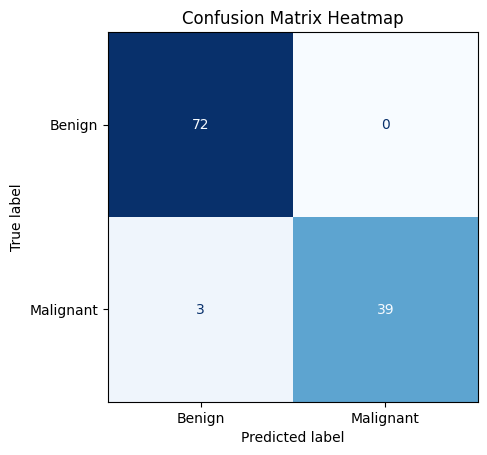

In [186]:
# Plot confusion matrix
cm_display = ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred, display_labels=['Benign', 'Malignant'], cmap='Blues', colorbar=False)
plt.title("Confusion Matrix Heatmap")
plt.show()

### ROC Curve

The ROC curve shows the trade-off between true positive rate (recall) and false positive rate at various thresholds

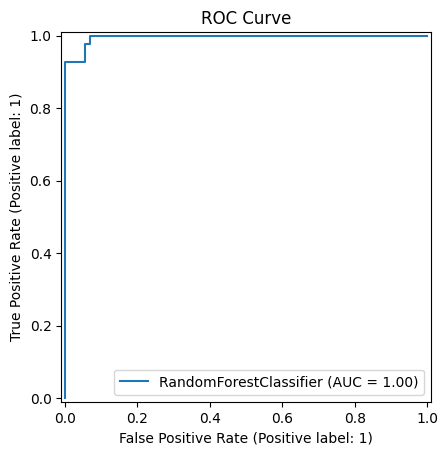

In [197]:
# Plot ROC curve
roc_display = RocCurveDisplay.from_estimator(best_rf, X_test, y_test)
plt.title("ROC Curve")
plt.show()

### Precision-Recall Curve

The Precision-Recall curve is helpful when dealing with imbalanced classes or when precision and recall are critical.

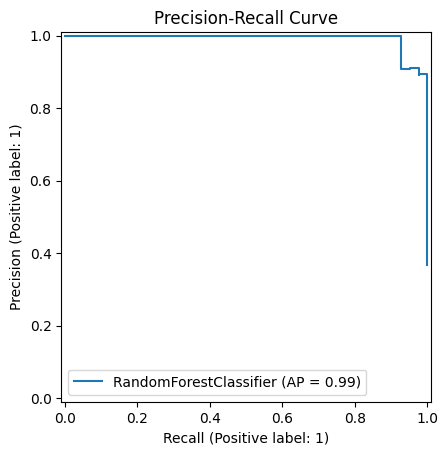

In [203]:
# Plot Precision-Recall curve
pr_display = PrecisionRecallDisplay.from_estimator(best_rf, X_test, y_test)
plt.title("Precision-Recall Curve")
plt.show()

### Feature Importance Bar Plot

Visualizing the feature importances can help interpret which features contribute most to the model's predictions.

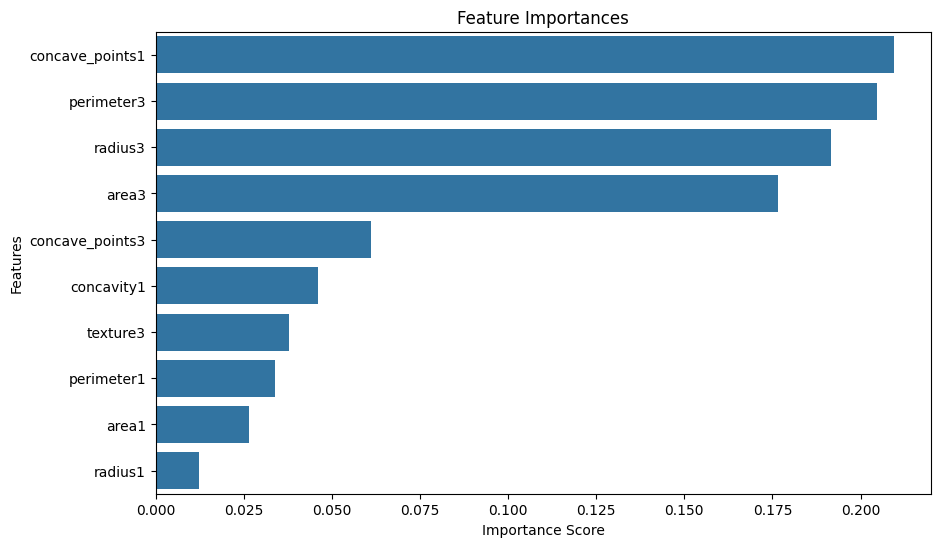

In [213]:
# Get feature importances
feature_importances = best_rf.feature_importances_
feature_names = X_train_eval.columns
sorted_idx = np.argsort(feature_importances)[::-1]

# Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importances[sorted_idx], 
            y=feature_names[sorted_idx])
plt.title("Feature Importances")
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.show()

We can see that `concave_points1`, `perimeter3`, `radius3` and `area3` are the features that contribute most towards the prediction of our model.

# BreakHis Dataset (Image Data)

In [3]:
# Base directory path for the BreaKHis dataset
base_dir = 'archive/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/'

# Dictionary to hold file paths for benign and malignant types
image_paths = {
    'benign': {},
    'malignant': {}
}

# Function to load image paths, considering the detailed directory structure
def load_image_paths(base_dir, classes=('benign', 'malignant')):
    for tumor_class in classes:
        class_path = os.path.join(base_dir, tumor_class, 'SOB')  # Navigate to the SOB folder within each class
        
        # Traverse each tumor type (e.g., adenosis, ductal_carcinoma)
        for tumor_type in os.listdir(class_path):
            tumor_type_path = os.path.join(class_path, tumor_type)
            
            # Initialize dictionary to store images by magnification for each type
            image_paths[tumor_class][tumor_type] = {}
            
            # Traverse each patient's folder within the tumor type
            for patient_folder in os.listdir(tumor_type_path):
                patient_path = os.path.join(tumor_type_path, patient_folder)
                
                if os.path.isdir(patient_path):
                    # Traverse each magnification level folder within the patient folder
                    for magnification in os.listdir(patient_path):
                        magnification_path = os.path.join(patient_path, magnification)
                        
                        # Get list of image files in the magnification folder
                        images = [
                            os.path.join(magnification_path, img) 
                            for img in os.listdir(magnification_path) 
                            if img.endswith('.png')
                        ]
                        
                        # Store image paths under the tumor type and magnification level
                        if magnification not in image_paths[tumor_class][tumor_type]:
                            image_paths[tumor_class][tumor_type][magnification] = []
                        
                        # Append images to the list for the specific magnification level
                        image_paths[tumor_class][tumor_type][magnification].extend(images)
                        
    print("Image paths loaded successfully.")
    return image_paths

# Load the image paths for benign and malignant classes
image_paths = load_image_paths(base_dir)


Image paths loaded successfully.


### Visualization of Images

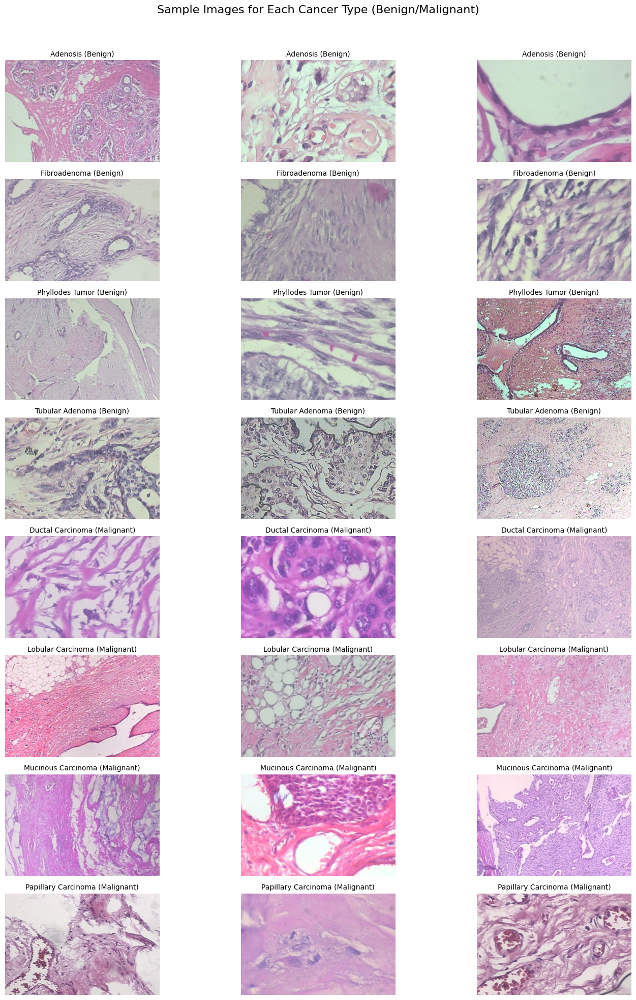

In [3]:
# Updated function to visualize 3 random images per cancer type
def visualize_samples_by_cancer_type(image_paths, num_samples=3):
    # Determine the number of rows required based on the number of cancer types
    num_types = sum(len(types) for types in image_paths.values())
    fig, axs = plt.subplots(num_types, num_samples, figsize=(15, 20))
    fig.suptitle('Sample Images for Each Cancer Type (Benign/Malignant)', fontsize=16)

    row = 0  # Track row index for subplot
    for tumor_class, types_dict in image_paths.items():
        for tumor_type, magnifications_dict in types_dict.items():
            # Collect all image paths for this type across all magnifications and subjects
            all_images = [img for images in magnifications_dict.values() for img in images]
            
            # Select random images if available, up to `num_samples`
            images = random.sample(all_images, min(num_samples, len(all_images)))
            
            for col, img_path in enumerate(images):
                # Load and display the image
                img = mpimg.imread(img_path)
                axs[row, col].imshow(img)
                axs[row, col].axis('off')
                
                # Set title with cancer type and benign/malignant label
                axs[row, col].set_title(f"{tumor_type.replace('_', ' ').title()} ({tumor_class.capitalize()})", fontsize=10)
            
            # Hide remaining subplots if there are fewer images than `num_samples`
            for remaining_col in range(len(images), num_samples):
                axs[row, remaining_col].axis('off')
            
            row += 1

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# Visualize samples
visualize_samples_by_cancer_type(image_paths, num_samples=3)


### Count of Benign and Malignant Images

In [214]:
# Dictionary to store counts for each subclass and overall benign/malignant counts
counts = {'benign': {}, 'malignant': {}, 'total_benign': 0, 'total_malignant': 0}

# Iterate through each tumor class and type in the image_paths
for tumor_class, types_dict in image_paths.items():
    for tumor_type, magnifications_dict in types_dict.items():
        # Calculate the total number of images for each tumor type across magnifications
        total_images = sum(len(images) for images in magnifications_dict.values())
        
        # Store the count for each subclass
        counts[tumor_class][tumor_type] = total_images
        
        # Add to the total benign or malignant count
        if tumor_class == 'benign':
            counts['total_benign'] += total_images
        elif tumor_class == 'malignant':
            counts['total_malignant'] += total_images

# Print total counts
print("Total number of image samples:", counts['total_benign'] + counts['total_malignant'])
print(f"Total number of benign images: {counts['total_benign']}")
print(f"Total number of malignant images: {counts['total_malignant']}")

# Print subclass counts
print("\nDetailed subclass counts:")
for tumor_class in ['benign', 'malignant']:
    print(f"\n{tumor_class.capitalize()}:")
    for tumor_type, count in counts[tumor_class].items():
        print(f"  {tumor_type}: {count} images")


Total number of image samples: 7909
Total number of benign images: 2480
Total number of malignant images: 5429

Detailed subclass counts:

Benign:
  adenosis: 444 images
  fibroadenoma: 1014 images
  phyllodes_tumor: 453 images
  tubular_adenoma: 569 images

Malignant:
  ductal_carcinoma: 3451 images
  lobular_carcinoma: 626 images
  mucinous_carcinoma: 792 images
  papillary_carcinoma: 560 images


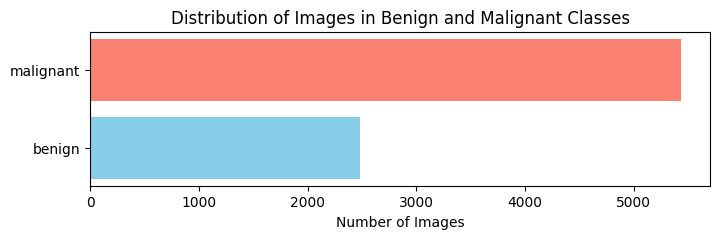

In [7]:
# Create the plot
plt.figure(figsize=(8, 2))
plt.barh(list(counts.keys()), list(counts.values()), color=['skyblue', 'salmon'])
plt.xlabel("Number of Images")
plt.title("Distribution of Images in Benign and Malignant Classes")
plt.show()

We can see that there is a high imbalance between classes. It is better to

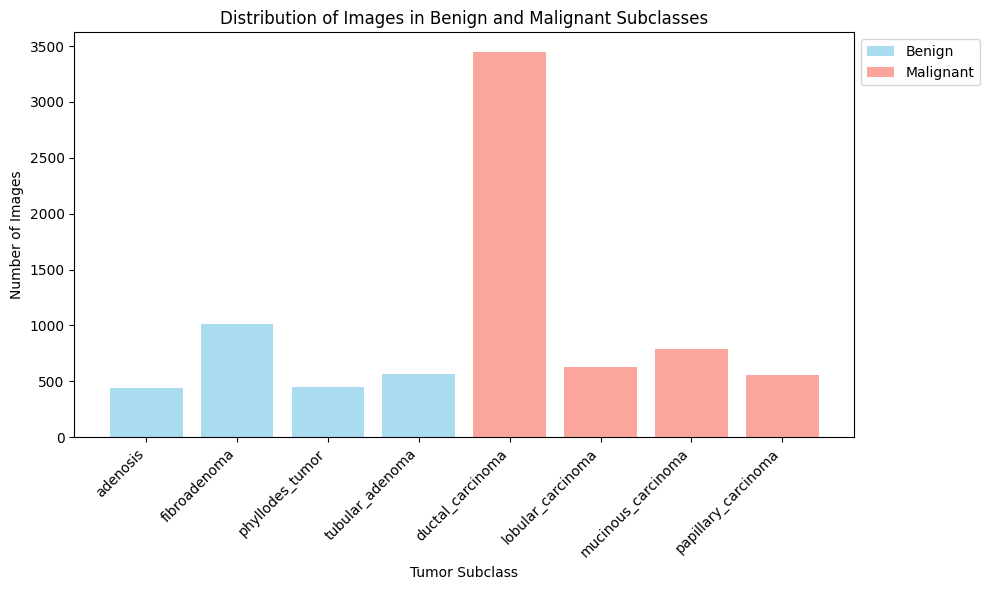

In [217]:
# Extract the subclass names and their counts
benign_subclasses = list(counts['benign'].keys())
benign_counts = list(counts['benign'].values())
malignant_subclasses = list(counts['malignant'].keys())
malignant_counts = list(counts['malignant'].values())

# Set up the figure
plt.figure(figsize=(10, 6))

# Plot the benign and malignant subclass distributions
plt.bar(benign_subclasses, benign_counts, color='skyblue', label='Benign', alpha=0.7)
plt.bar(malignant_subclasses, malignant_counts, color='salmon', label='Malignant', alpha=0.7)

# Add labels and title
plt.xlabel('Tumor Subclass')
plt.ylabel('Number of Images')
plt.title('Distribution of Images in Benign and Malignant Subclasses')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

# Place legend outside of the plot area
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Adjust layout for readability
plt.tight_layout()

# Show the plot
plt.show()


### Preprocessing and Data Augmentation

#### Image Resizing

In [200]:
# Set parameters
IMG_SIZE = (224, 224)  # Resize to 224x224
benign_aug_count = 3  # Apply augmentation 3 times on each benign image
malignant_aug_count = 1  # Apply augmentation once on each malignant image

# Augmentation setup
datagen_benign = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen_malignant = ImageDataGenerator(
    rotation_range=10,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [192]:
# Function to load and resize images from the image paths
def load_and_resize_images(image_paths, img_size):
    images = []
    labels = []
    for tumor_class, tumor_data in image_paths.items():
        for tumor_type, magnification_data in tumor_data.items():
            for magnification, img_paths in magnification_data.items():
                for img_path in img_paths:
                    img = cv2.imread(img_path)
                    img = cv2.resize(img, img_size)  # Resize image to target size
                    images.append(img)
                    labels.append(f'{tumor_class}_{tumor_type}')
    return np.array(images), np.array(labels)

# Load and resize images from the paths
images, labels = load_and_resize_images(image_paths, IMG_SIZE)

In [15]:
images.shape

(7909, 224, 224, 3)

#### Data Augmentation (differential for Benign and Malignant)

### Taking into account total benign and malignant count

In [202]:
# Function to save images with augmentations in batches
def augment_and_save_images(image_paths, output_dir, img_size, benign_aug_count, malignant_aug_count):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
        
    for tumor_class, tumor_data in image_paths.items():
        # Set augmentation generator and count
        if tumor_class == 'benign':
            datagen = datagen_benign
            aug_count = benign_aug_count
        else:
            datagen = datagen_malignant
            aug_count = malignant_aug_count

        print(f"\nProcessing tumor class: {tumor_class.upper()}")  # Progress print

        # Iterate over tumor types and magnifications
        for tumor_type, magnifications in tumor_data.items():
            print(f"  Tumor type: {tumor_type}")  # Progress print
            
            for magnification, img_files in magnifications.items():
                print(f"    Magnification level: {magnification} - Total images: {len(img_files)}")  # Progress print
                
                for idx, img_path in enumerate(img_files):
                    img = cv2.imread(img_path)
                    img = cv2.resize(img, img_size)  # Resize to target size
                    
                    # Reshape for augmentation
                    img = img.reshape((1,) + img.shape)
                    
                    # Create augmented images and save to disk
                    for i, batch in enumerate(datagen.flow(img, batch_size=1)):
                        aug_img = batch[0].astype(np.uint8)
                        
                        # Create folder structure for saving augmented images
                        aug_output_dir = os.path.join(output_dir, tumor_class, tumor_type, magnification)
                        os.makedirs(aug_output_dir, exist_ok=True)
                        
                        # Save the augmented image
                        aug_img_filename = f"{os.path.splitext(os.path.basename(img_path))[0]}_aug_{i}.png"
                        cv2.imwrite(os.path.join(aug_output_dir, aug_img_filename), aug_img)
                        
                        # Progress print for each augmented image
                        print(f"      Saved augmentation {i + 1}/{aug_count} for image {idx + 1}/{len(img_files)} in {tumor_type} ({magnification})")
                        
                        # Stop after generating the specified number of augmentations
                        if i >= aug_count - 1:
                            break

    print(f"\nAugmentation completed. Augmented images saved to {output_dir}")

# Set the output directory for augmented images
output_dir = 'archive/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/augmented_images_binary'

# Load image paths and process images in batches for augmentation
image_paths = load_image_paths(base_dir)
augment_and_save_images(image_paths, output_dir, IMG_SIZE, benign_aug_count, malignant_aug_count)

Image paths loaded successfully.

Processing tumor class: BENIGN
  Tumor type: adenosis
    Magnification level: 100X - Total images: 113
      Saved augmentation 1/3 for image 1/113 in adenosis (100X)
      Saved augmentation 2/3 for image 1/113 in adenosis (100X)
      Saved augmentation 3/3 for image 1/113 in adenosis (100X)
      Saved augmentation 1/3 for image 2/113 in adenosis (100X)
      Saved augmentation 2/3 for image 2/113 in adenosis (100X)
      Saved augmentation 3/3 for image 2/113 in adenosis (100X)
      Saved augmentation 1/3 for image 3/113 in adenosis (100X)
      Saved augmentation 2/3 for image 3/113 in adenosis (100X)
      Saved augmentation 3/3 for image 3/113 in adenosis (100X)
      Saved augmentation 1/3 for image 4/113 in adenosis (100X)
      Saved augmentation 2/3 for image 4/113 in adenosis (100X)
      Saved augmentation 3/3 for image 4/113 in adenosis (100X)
      Saved augmentation 1/3 for image 5/113 in adenosis (100X)
      Saved augmentation 2/3 f

#### Merging Augmented and Original Images

In [204]:
# Define source directories (original and augmented) and target directories
original_dir = base_dir
augmented_dir = output_dir  # where augmented images were saved
merged_dir = 'archive/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/merged_images_binary'  # final directory for all images

# Ensure merged directories for benign and malignant
os.makedirs(os.path.join(merged_dir, 'benign'), exist_ok=True)
os.makedirs(os.path.join(merged_dir, 'malignant'), exist_ok=True)

# Helper function to copy images from original and augmented directories
def merge_images(src_dir, dest_dir):
    # Use glob to get all image files in source directory
    img_files = glob(os.path.join(src_dir, '**', '*.png'), recursive=True)
    for img_path in img_files:
        # Copy each image file to the destination directory
        shutil.copy(img_path, dest_dir)

# Merge original and augmented images for both benign and malignant classes
print("Merging benign images...")
merge_images(os.path.join(original_dir, 'benign'), os.path.join(merged_dir, 'benign'))
merge_images(os.path.join(augmented_dir, 'benign'), os.path.join(merged_dir, 'benign'))

print("Merging malignant images...")
merge_images(os.path.join(original_dir, 'malignant'), os.path.join(merged_dir, 'malignant'))
merge_images(os.path.join(augmented_dir, 'malignant'), os.path.join(merged_dir, 'malignant'))

# Output the final image count
total_benign = len(os.listdir(os.path.join(merged_dir, 'benign')))
total_malignant = len(os.listdir(os.path.join(merged_dir, 'malignant')))
total_images = total_benign + total_malignant

print("\nFinal image counts after merging:")
print(f"Total benign images: {total_benign}")
print(f"Total malignant images: {total_malignant}")
print(f"Total images: {total_images}")


Merging benign images...
Merging malignant images...

Final image counts after merging:
Total benign images: 9920
Total malignant images: 10858
Total images: 20778


### Multi Class Augmentation

Calculate the amount of augmentation that needs to be carries out for each sub class binary cancer, keeping an upper threshold of a total of each sub class total of 3500 images (almost the size of reference class of ductal_carcinoma = 3451 images), for proper model training.

In [278]:
# Set Parameters
benign_aug_count = 2  # Apply augmentation 2 times on each benign image
malignant_aug_count = 1  # Apply augmentation once on each malignant image
sub_class_target_image_count = 3500  # Target image count per class after augmentation

In [280]:
# Function to count and balance images per class and magnification
def calculate_augmentation_counts(image_paths, target_image_count):
    augmentation_counts = {}

    # Iterate through each tumor class, tumor type, and magnification
    for tumor_class, tumor_data in image_paths.items():
        augmentation_counts[tumor_class] = {}

        for tumor_type, magnifications in tumor_data.items():
            total_image_count = 0

            # Sum the images across all magnification levels for this tumor type
            for magnification, img_files in magnifications.items():
                total_image_count += len(img_files)  # Count the images in this magnification
                print(f"Class: {tumor_class}, Type: {tumor_type}, Magnification: {magnification}, Image Count: {len(img_files)}")

            # Calculate how many augmentations are needed for this tumor type to meet the target
            print(f"Total image count for {tumor_class} - {tumor_type}: {total_image_count}")

            # Calculate how many augmentations are needed to meet the target
            if total_image_count <= target_image_count:
                aug_count_needed = (target_image_count - total_image_count) // total_image_count
            else:
                aug_count_needed = 0  # No augmentations needed if the count already exceeds the target

            augmentation_counts[tumor_class][tumor_type] = aug_count_needed

    return augmentation_counts

# Load image path
image_paths = load_image_paths(base_dir)
# Calculate augmentation counts based on the current class distribution
augmentation_counts = calculate_augmentation_counts(image_paths, sub_class_target_image_count)

Image paths loaded successfully.
Class: benign, Type: adenosis, Magnification: 100X, Image Count: 113
Class: benign, Type: adenosis, Magnification: 200X, Image Count: 111
Class: benign, Type: adenosis, Magnification: 400X, Image Count: 106
Class: benign, Type: adenosis, Magnification: 40X, Image Count: 114
Total image count for benign - adenosis: 444
Class: benign, Type: fibroadenoma, Magnification: 100X, Image Count: 260
Class: benign, Type: fibroadenoma, Magnification: 200X, Image Count: 264
Class: benign, Type: fibroadenoma, Magnification: 400X, Image Count: 237
Class: benign, Type: fibroadenoma, Magnification: 40X, Image Count: 253
Total image count for benign - fibroadenoma: 1014
Class: benign, Type: phyllodes_tumor, Magnification: 100X, Image Count: 121
Class: benign, Type: phyllodes_tumor, Magnification: 200X, Image Count: 108
Class: benign, Type: phyllodes_tumor, Magnification: 400X, Image Count: 115
Class: benign, Type: phyllodes_tumor, Magnification: 40X, Image Count: 109
Tot

In [282]:
# Print augmentation count
print(f'Augmentation count based on current sub-class distribution:\n{augmentation_counts}')

Augmentation count based on current sub-class distribution:
{'benign': {'adenosis': 6, 'fibroadenoma': 2, 'phyllodes_tumor': 6, 'tubular_adenoma': 5}, 'malignant': {'ductal_carcinoma': 0, 'lobular_carcinoma': 4, 'mucinous_carcinoma': 3, 'papillary_carcinoma': 5}}


**Augmentation of Multi-Class**

In [284]:
# Initialize the augmentation generators (adjust these based on your requirements)
datagen_benign = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

datagen_malignant = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [286]:
# Function to save images with augmentations in batches
def augment_and_save_images(image_paths, output_dir, img_size, augmentation_counts):
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
        
    for tumor_class, tumor_data in image_paths.items():
        # Set augmentation generator and count
        if tumor_class == 'benign':
            datagen = datagen_benign
            aug_count_dict = augmentation_counts['benign']
        else:
            datagen = datagen_malignant
            aug_count_dict = augmentation_counts['malignant']

        print(f"\nProcessing tumor class: {tumor_class.upper()}")  # Progress print

        # Iterate over tumor types and magnifications
        for tumor_type, magnifications in tumor_data.items():
            print(f"  Tumor type: {tumor_type}")  # Progress print
            
            for magnification, img_files in magnifications.items():
                print(f"    Magnification level: {magnification} - Total images: {len(img_files)}")  # Progress print
                
                # Get the augmentation count for the current tumor type
                aug_count = aug_count_dict.get(tumor_type, 0)
                if aug_count == 0:
                    print(f"      No augmentation needed for {tumor_type} in {magnification}. Skipping.")
                    continue
                
                for idx, img_path in enumerate(img_files):
                    img = cv2.imread(img_path)
                    img = cv2.resize(img, img_size)  # Resize to target size
                    
                    # Reshape for augmentation
                    img = img.reshape((1,) + img.shape)
                    
                    # Create augmented images and save to disk
                    for i, batch in enumerate(datagen.flow(img, batch_size=1)):
                        aug_img = batch[0].astype(np.uint8)
                        
                        # Create folder structure for saving augmented images
                        aug_output_dir = os.path.join(output_dir, tumor_class, tumor_type, magnification)
                        os.makedirs(aug_output_dir, exist_ok=True)
                        
                        # Save the augmented image
                        aug_img_filename = f"{os.path.splitext(os.path.basename(img_path))[0]}_aug_{i}.png"
                        cv2.imwrite(os.path.join(aug_output_dir, aug_img_filename), aug_img)
                        
                        # Progress print for each augmented image
                        print(f"      Saved augmentation {i + 1}/{aug_count} for image {idx + 1}/{len(img_files)} in {tumor_type} ({magnification})")
                        
                        # Stop after generating the specified number of augmentations
                        if i >= aug_count - 1:
                            break

    print(f"\nAugmentation completed. Augmented images saved to {output_dir}")

# Set the output directory for augmented images
output_dir = 'archive/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/augmented_images_subclass/'

# Load image paths (assuming you have this function to load image paths)
image_paths = load_image_paths(base_dir)

# Perform data augmentation
augment_and_save_images(image_paths, output_dir, IMG_SIZE, augmentation_counts)

Image paths loaded successfully.

Processing tumor class: BENIGN
  Tumor type: adenosis
    Magnification level: 100X - Total images: 113
      Saved augmentation 1/6 for image 1/113 in adenosis (100X)
      Saved augmentation 2/6 for image 1/113 in adenosis (100X)
      Saved augmentation 3/6 for image 1/113 in adenosis (100X)
      Saved augmentation 4/6 for image 1/113 in adenosis (100X)
      Saved augmentation 5/6 for image 1/113 in adenosis (100X)
      Saved augmentation 6/6 for image 1/113 in adenosis (100X)
      Saved augmentation 1/6 for image 2/113 in adenosis (100X)
      Saved augmentation 2/6 for image 2/113 in adenosis (100X)
      Saved augmentation 3/6 for image 2/113 in adenosis (100X)
      Saved augmentation 4/6 for image 2/113 in adenosis (100X)
      Saved augmentation 5/6 for image 2/113 in adenosis (100X)
      Saved augmentation 6/6 for image 2/113 in adenosis (100X)
      Saved augmentation 1/6 for image 3/113 in adenosis (100X)
      Saved augmentation 2/6 f

#### Merge Original and Augmented Images

In [288]:
def merge_images(image_paths, augmented_dir, output_dir):
    total_counts = {'benign': {}, 'malignant': {}}
    
    # Loop through the image paths for each tumor class and subtype
    for tumor_class, tumor_types in image_paths.items():
        print(f"\nMerging images for {tumor_class.upper()} class")
        
        for tumor_type, magnifications in tumor_types.items():
            output_type_dir = os.path.join(output_dir, tumor_class, tumor_type)
            os.makedirs(output_type_dir, exist_ok=True)
            
            total_count = 0  # Initialize count for this subclass
            
            # Loop through each magnification level
            for magnification, images in magnifications.items():
                output_magnification_dir = os.path.join(output_type_dir, magnification)
                os.makedirs(output_magnification_dir, exist_ok=True)
                
                # Copy original images from image_paths
                for img_path in images:
                    destination_path = os.path.join(output_magnification_dir, os.path.basename(img_path))
                    if not os.path.exists(destination_path):  # Only copy if not already present
                        shutil.copy(img_path, destination_path)
                        total_count += 1
                
                # Add augmented images if available
                augmented_magnification_dir = os.path.join(augmented_dir, tumor_class, tumor_type, magnification)
                if os.path.exists(augmented_magnification_dir):
                    for img_file in os.listdir(augmented_magnification_dir):
                        img_path = os.path.join(augmented_magnification_dir, img_file)
                        destination_path = os.path.join(output_magnification_dir, img_file)
                        if os.path.isfile(img_path) and not os.path.exists(destination_path):
                            shutil.copy(img_path, destination_path)
                            total_count += 1
            
            # Store total count for this subclass
            total_counts[tumor_class][tumor_type] = total_count
            print(f"  {tumor_type}: {total_count} images")
    
    return total_counts


# Directories
augmented_dir = 'archive/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/augmented_images_subclass/'
merged_dir = 'archive/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/merged_images_subclass'

# Merge images and calculate counts using the preloaded image_paths
total_image_counts = merge_images(image_paths, augmented_dir, merged_dir)


Merging images for BENIGN class
  adenosis: 3108 images
  fibroadenoma: 3042 images
  phyllodes_tumor: 3171 images
  tubular_adenoma: 3414 images

Merging images for MALIGNANT class
  ductal_carcinoma: 3451 images
  lobular_carcinoma: 3130 images
  mucinous_carcinoma: 3168 images
  papillary_carcinoma: 3360 images


**Remove Augmented images folder to free up memory!!**

In [290]:
# Remove augmented directory for make space
aug_dir_binary = 'archive/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/augmented_images_binary/'
aug_dir_subclass = 'archive/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/augmented_images_subclass/'

try:
    shutil.rmtree(aug_dir_binary)
    print('Successfully removed Augmented Images for Binary Model!!')
    shutil.rmtree(aug_dir_subclass)
    print('Successfully removed Augmented Images for Multi-Class Model!!')
except Exception as e:
        print(f'Error in Removing the Directory: {e}')

Error in Removing the Directory: [WinError 3] The system cannot find the path specified: 'archive/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/augmented_images_binary/'


**Visualize the sub-class distribution**

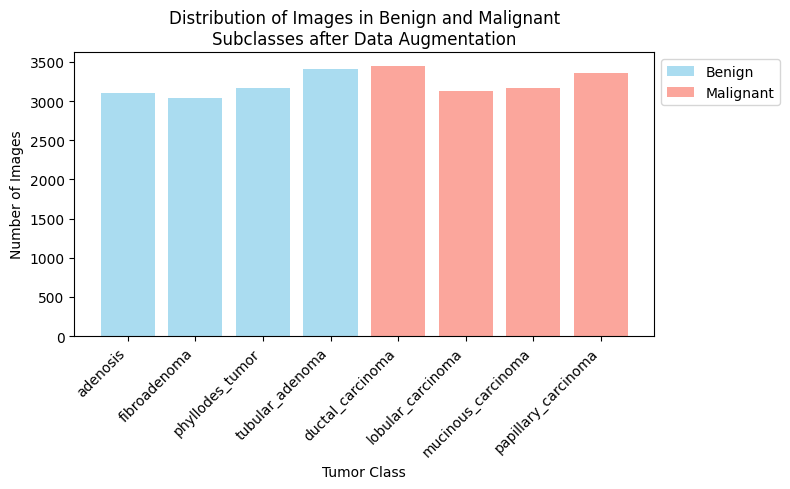

In [292]:
# Prepare the data for plotting
benign_subclasses = list(total_image_counts['benign'].keys())
benign_counts = list(total_image_counts['benign'].values())

malignant_subclasses = list(total_image_counts['malignant'].keys())
malignant_counts = list(total_image_counts['malignant'].values())

# Set up the plot
plt.figure(figsize=(8, 5))

# Plot the benign and malignant subclasses in two different groups
plt.bar(benign_subclasses, benign_counts, color='skyblue', label='Benign', alpha=0.7)
plt.bar(malignant_subclasses, malignant_counts, color='salmon', label='Malignant', alpha=0.7)

# Add labels and title
plt.xlabel('Tumor Class')
plt.ylabel('Number of Images')
plt.title('Distribution of Images in Benign and Malignant\nSubclasses after Data Augmentation')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

# Display the plot
plt.tight_layout()
plt.show()

In [294]:
print('Total images for Benign class:', sum(benign_counts), 'images\nTotal images for Malignant class:', sum(malignant_counts), 'images')

Total images for Benign class: 12735 images
Total images for Malignant class: 13109 images


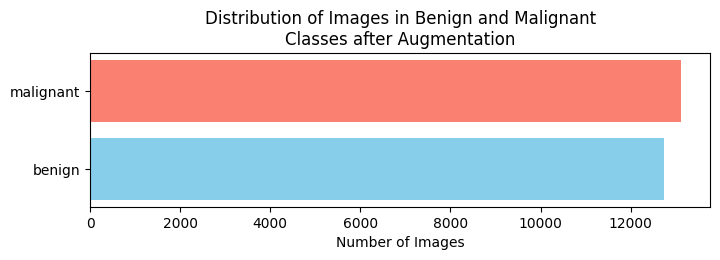

In [296]:
# Create the plot
plt.figure(figsize=(8, 2))
plt.barh((['benign', 'malignant']),(sum(benign_counts), sum(malignant_counts)), color=['skyblue', 'salmon'])
plt.xlabel("Number of Images")
plt.title("Distribution of Images in Benign and Malignant\nClasses after Augmentation")
plt.show()

### Split dataset 

In [3]:
def load_and_split_dataset(directory, img_size=(224, 224), batch_size=32, seed=123):
    """
    Load images from the given directory and split into training, validation, and test sets.
    
    Parameters:
    - directory: Path to the images directory.
    - img_size: Target image size.
    - batch_size: Number of samples per batch.
    - seed: Random seed for reproducibility.
    
    Returns:
    - train_ds: Training dataset.
    - val_ds: Validation dataset.
    - test_ds: Test dataset.
    """
    
    # Determine label mode based on dataset type (binary or multiclass)
    # int for binary, categorical for multiclass
    label_mode='int' if "binary" in directory else 'categorical'
    
    # Load the full dataset from directory
    full_ds = tf.keras.preprocessing.image_dataset_from_directory(
        directory,
        image_size=img_size,
        batch_size=batch_size,
        seed=seed,
        label_mode=label_mode  # Adjust label mode for binary or multiclass
    )

    # Convert binary labels to required format if necessary
    if label_mode == 'int':
        # Map to ensure binary labels are in shape (batch_size, 1) by expanding dimensions
        full_ds = full_ds.map(lambda x, y: (x, tf.expand_dims(y, axis=-1)))

    # Shuffle the dataset first
    dataset_size = len(full_ds)
    full_ds = full_ds.shuffle(dataset_size, seed=seed)
    
    # Calculate the number of images in each set
    train_size = int(0.7 * dataset_size)
    val_size = int(0.15 * dataset_size)
    test_size = dataset_size - train_size - val_size

    # Shuffle and split the dataset
    train_ds = full_ds.take(train_size)
    val_test_ds = full_ds.skip(train_size)
    val_ds = val_test_ds.take(val_size)
    test_ds = val_test_ds.skip(val_size)
    
    return train_ds, val_ds, test_ds

In [17]:
merged_dir_binary = 'archive/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/merged_images_binary/'

# Example usage for binary classification
binary_train_ds, binary_val_ds, binary_test_ds = load_and_split_dataset(
    directory=merged_dir_binary,
    img_size=(224, 224),
    batch_size=3104
)

Found 20778 files belonging to 2 classes.


#### Flatten directory structure of `merged_images_subclass`

In [302]:
# Define the original and new paths
original_dir = 'archive/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/merged_images_subclass/'
new_dir = 'archive/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/merged_images_multiclass'

# Create the new directory if it doesn't exist
os.makedirs(new_dir, exist_ok=True)

# Define mappings to rename subclasses with "b" or "m" prefix
benign_subclasses = {
    'adenosis': 'b_adenosis',
    'fibroadenoma': 'b_fibroadenoma',
    'phyllodes_tumor': 'b_phyllodes_tumor',
    'tubular_adenoma': 'b_tubular_adenoma'
}

malignant_subclasses = {
    'ductal_carcinoma': 'm_ductal_carcinoma',
    'lobular_carcinoma': 'm_lobular_carcinoma',
    'mucinous_carcinoma': 'm_mucinous_carcinoma',
    'papillary_carcinoma': 'm_papillary_carcinoma'
}

# Function to move images from nested structure to new flat structure
def flatten(class_path, new_name):
    new_class_path = os.path.join(new_dir, new_name)
    os.makedirs(new_class_path, exist_ok=True)
    
    # Iterate through each magnification folder (40x, 100x, etc.) in the current subclass
    for root, _, files in os.walk(class_path):
        for file in files:
            # Move each image file to the new renamed directory
            shutil.copy(os.path.join(root, file), os.path.join(new_class_path, file))

# Process benign subclasses
for subclass, new_name in benign_subclasses.items():
    class_path = os.path.join(original_dir, 'benign', subclass)
    flatten(class_path, new_name)
print('Flattened Benign Subclasses!!')

# Process malignant subclasses
for subclass, new_name in malignant_subclasses.items():
    class_path = os.path.join(original_dir, 'malignant', subclass)
    flatten(class_path, new_name)
print('Flattened Malignant Subclasses!!')

print("Directory restructuring and renaming complete.")

Flattened Benign Subclasses!!
Flattened Malignant Subclasses!!
Directory restructuring and renaming complete.


In [304]:
# Remove merged_images_subclass directory 
# We will use flattened merged_images_multiclass directory for multi class classification
shutil.rmtree('archive/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/merged_images_subclass/')

In [99]:
merged_dir_subclass = 'archive/BreaKHis_v1/BreaKHis_v1/histology_slides/breast/merged_images_multiclass/'

# Example usage for multi-class classification
multiclass_train_ds, multiclass_val_ds, multiclass_test_ds = load_and_split_dataset(
    directory=merged_dir_subclass,
    img_size=(224, 224),
    batch_size=32
)

Found 25844 files belonging to 8 classes.


### Define CNN Model

In [7]:
# For Binaryclass model
def create_cnn_model_binary(input_shape=(224, 224, 3), num_classes=2, l2_lambda=0.001):
    model = models.Sequential([
        layers.Input(shape=input_shape),
        
        # Convolutional Block 1
        layers.Conv2D(32, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2_lambda), name='conv1_1'),
        layers.Conv2D(32, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2_lambda), name='conv1_2'),
        layers.MaxPooling2D((2, 2), name='max_pool1'),
        layers.BatchNormalization(),

        # Convolutional Block 2
        layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2_lambda), name='conv2_1'),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2_lambda), name='conv2_2'),
        layers.MaxPooling2D((2, 2), name='max_pool2'),
        layers.BatchNormalization(),

        # Convolutional Block 3
        layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2_lambda), name='conv3_1'),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=regularizers.l2(l2_lambda), name='conv3_2'),
        layers.MaxPooling2D((2, 2), name='max_pool3'),
        layers.BatchNormalization(),

        # Flatten and Dense Layers
        layers.Flatten(name='flatten'),
        layers.Dense(256, activation='relu', name='dense1', kernel_regularizer=regularizers.l2(l2_lambda)),
        layers.Dropout(0.5),  # Dropout for regularization

        # Output layer based on the number of classes
        layers.Dense(1, activation='sigmoid', name='output')
    ])
    
    # Select loss function based on number of classes
    loss = 'binary_crossentropy'

    # Compile the model
    model.compile(
        optimizer=optimizers.Adam(learning_rate=1e-5),
        loss=loss,
        metrics=['accuracy']
    )
    
    return model


In [111]:
# For Multiclass model
def create_cnn_model(num_classes, input_shape=(224, 224, 3)):
    model = models.Sequential([
        layers.Input(shape=input_shape),
        
        # Convolutional Block 1
        layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', name='conv1_1'),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', name='conv1_2'),
        layers.MaxPooling2D((2, 2), name='max_pool1'),
        layers.BatchNormalization(name='batch_normalization1'),
        
        # Convolutional Block 2
        layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', name='conv2_1'),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', name='conv2_2'),
        layers.MaxPooling2D((2, 2), name='max_pool2'),
        layers.BatchNormalization(name='batch_normalization2'),

        # Convolutional Block 3
        layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', name='conv3_1'),
        layers.Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer='he_normal', name='conv3_2'),
        layers.MaxPooling2D((2, 2), name='max_pool3'),
        layers.BatchNormalization(name='batch_normalization3'),

        # Global Average Pooling Layer
        layers.GlobalAveragePooling2D(name='global_avg_pool'),

        # Dense Layers
        layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.01), name='dense1'),
        layers.BatchNormalization(name='dense_batch_norm'),
        layers.Dropout(0.3),  # Lower dropout

        # Output layer
        layers.Dense(1 if num_classes == 2 else num_classes, 
                     activation='sigmoid' if num_classes == 2 else 'softmax', 
                     name='output')
    ])
    
    # Compile the model
    model.compile(
        optimizer=optimizers.Adam(learning_rate=1e-5, clipnorm=1.0),  # Lower learning rate
        loss='binary_crossentropy' if num_classes == 2 else 'categorical_crossentropy',
        metrics=['accuracy']
    )
    
    return model

In [9]:
# Create model instances for binary and multi-class cases
binary_model = create_cnn_model_binary()

In [ ]:
multiclass_model = create_cnn_model(num_classes=8)

In [13]:
# Binary model summary
binary_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1_1 (Conv2D)                     │ (None, 224, 224, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_2 (Conv2D)                     │ (None, 224, 224, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pool1 (MaxPooling2D)             │ (None, 112, 112, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 112, 112, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2_1 (Conv2D)                     │ (None, 112, 112, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2_2 (Conv2D)                     │ (None, 112, 112, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pool2 (MaxPooling2D)             │ (None, 56, 56, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 56, 56, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3_1 (Conv2D)                     │ (None, 56, 56, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3_2 (Conv2D)                     │ (None, 56, 56, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pool3 (MaxPooling2D)             │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 100352)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense1 (Dense)                       │ (None, 256)                 │      25,690,368 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output (Dense)                       │ (None, 1)                   │             257 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 25,978,529 (99.10 MB)

 Trainable params: 25,978,081 (99.10 MB)

 Non-trainable params: 448 (1.75 KB)

In [115]:
# Multi-class classification model summary
multiclass_model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv1_1 (Conv2D)                     │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1_2 (Conv2D)                     │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pool1 (MaxPooling2D)             │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization1                 │ (None, 112, 112, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2_1 (Conv2D)                     │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2_2 (Conv2D)                     │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pool2 (MaxPooling2D)             │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization2                 │ (None, 56, 56, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3_1 (Conv2D)                     │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3_2 (Conv2D)                     │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pool3 (MaxPooling2D)             │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization3                 │ (None, 28, 28, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_avg_pool                      │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense1 (Dense)                       │ (None, 512)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_batch_norm                     │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_13 (Dropout)                 │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output (Dense)                       │ (None, 8)                   │           4,104 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,284,936 (4.90 MB)

 Trainable params: 1,283,016 (4.89 MB)

 Non-trainable params: 1,920 (7.50 KB)

#### Set up Early Stopping and Learning Rate Scheduler

In [ ]:
#!pip install keras-cyclic-learning-rate

In [11]:
# Callbacks
# Early stopping 
early_stopping = callbacks.EarlyStopping(
    monitor='val_loss',
    patience=3,
    restore_best_weights=True
)

# Learning rate scheduler
lr_scheduler = callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.3,
    patience=3,
    min_lr=1e-6,
    verbose=1
)

#### Train the Model

In [15]:
# Define the ModelCheckpoint callback to save the model after each epoch
checkpoint_callback = ModelCheckpoint(
    'binary_model_checkpoint.keras',  # Path where the model will be saved
    save_best_only=True,  # Only save the best model based on validation loss
    monitor='val_loss',  # Monitor validation loss for saving the best model
    mode='min',  # 'min' means we are looking for the minimum validation loss
    verbose=1  # Print messages when saving the model
)

In [ ]:
# Train the binary model
history_binary = binary_model.fit(
    binary_train_ds,
    validation_data=binary_val_ds,
    epochs=20,
    callbacks=[early_stopping, lr_scheduler, checkpoint_callback]
)

Epoch 1/20
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.7583 - loss: 1.4063
Epoch 1: val_loss improved from inf to 1.17178, saving model to binary_model_checkpoint.keras
454/454 ━━━━━━━━━━━━━━━━━━━━ 1789s 4s/step - accuracy: 0.7583 - loss: 1.4061 - val_accuracy: 0.8666 - val_loss: 1.1718 - learning_rate: 1.0000e-05
Epoch 2/20
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8445 - loss: 1.1997
Epoch 2: val_loss improved from 1.17178 to 1.10357, saving model to binary_model_checkpoint.keras
454/454 ━━━━━━━━━━━━━━━━━━━━ 1758s 4s/step - accuracy: 0.8445 - loss: 1.1997 - val_accuracy: 0.9030 - val_loss: 1.1036 - learning_rate: 1.0000e-05
Epoch 3/20
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8806 - loss: 1.1264
Epoch 3: val_loss improved from 1.10357 to 1.03547, saving model to binary_model_checkpoint.keras
454/454 ━━━━━━━━━━━━━━━━━━━━ 1722s 4s/step - accuracy: 0.8807 - loss: 1.1263 - val_accuracy: 0.9280 - val_loss: 1.0355 - learning_rate: 1.0000e-05
Epoch 4/20
264

In [ ]:
# Save the model weights after training
binary_model.save_weights('binary_model_weights.h5')

In [13]:
# Load the previously saved model
saved_model_path = 'binary_model_checkpoint.keras'  # Replace with your file path
binary_model = tf.keras.models.load_model(saved_model_path)

In [19]:
# Train the model with the callback
history_binary = binary_model.fit(
    binary_train_ds,
    validation_data=binary_val_ds,
    epochs=20,  # Total number of epochs to train
    initial_epoch=3,  # Start from the last completed epoch
    callbacks=[early_stopping, lr_scheduler, checkpoint_callback]  # Include checkpoint callback
)

Epoch 4/20
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9049 - loss: 1.0655
Epoch 4: val_loss improved from inf to 0.96515, saving model to binary_model_checkpoint.keras
454/454 ━━━━━━━━━━━━━━━━━━━━ 1511s 3s/step - accuracy: 0.9049 - loss: 1.0654 - val_accuracy: 0.9494 - val_loss: 0.9652 - learning_rate: 1.0000e-05
Epoch 5/20
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9291 - loss: 1.0020
Epoch 5: val_loss improved from 0.96515 to 0.93429, saving model to binary_model_checkpoint.keras
454/454 ━━━━━━━━━━━━━━━━━━━━ 1556s 3s/step - accuracy: 0.9291 - loss: 1.0020 - val_accuracy: 0.9597 - val_loss: 0.9343 - learning_rate: 1.0000e-05
Epoch 6/20
454/454 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9411 - loss: 0.9619
Epoch 6: val_loss improved from 0.93429 to 0.88866, saving model to binary_model_checkpoint.keras
454/454 ━━━━━━━━━━━━━━━━━━━━ 1497s 3s/step - accuracy: 0.9411 - loss: 0.9619 - val_accuracy: 0.9794 - val_loss: 0.8887 - learning_rate: 1.0000e-05
Epoch 7/20
454

In [7]:
# Load the previously saved model
saved_model_path = 'binary_model_checkpoint.keras'  # Replace with your file path
binary_model = tf.keras.models.load_model(saved_model_path)

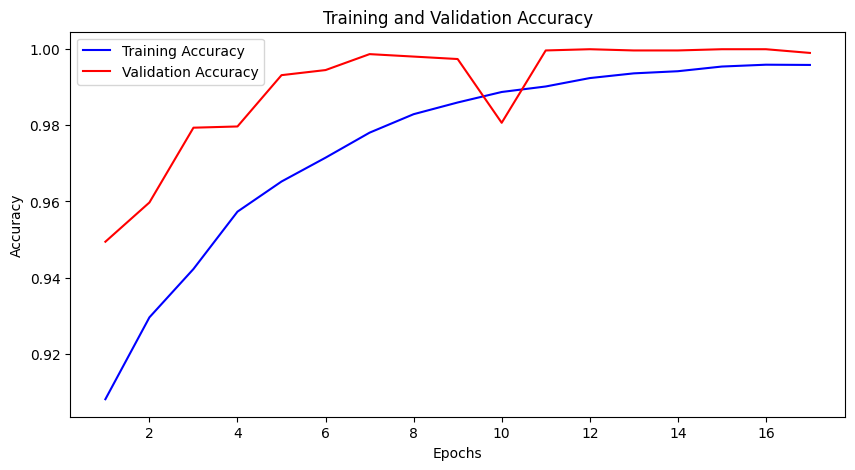

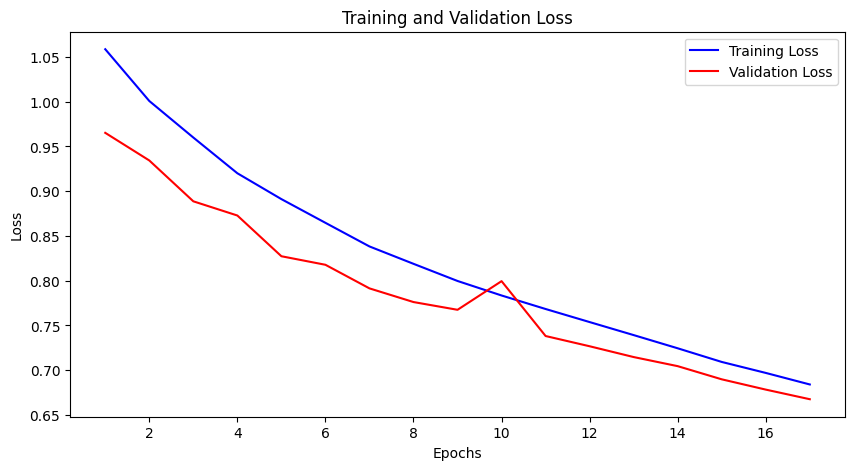

In [25]:
# Extract metrics from the history object
acc = binary_model.history['accuracy']
val_acc = binary_model.history['val_accuracy']
loss = binary_model.history['loss']
val_loss = binary_model.history['val_loss']

# Create line plots
epochs = range(1, len(acc) + 1)

# Plot Accuracy
plt.figure(figsize=(10, 5))
plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot Loss
plt.figure(figsize=(10, 5))
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
binar_model_loss, binar_model_accuracy = binary_model.evaluate(binary_test_ds)
print(f"Binary Model Test Loss: {binar_model_loss:.4f}")
print(f"Binary Model Test Accuracy: {binar_model_accuracy:.4f}")

In [83]:
binar_model_loss, binar_model_accuracy = binary_model.evaluate(binary_test_ds)
print(f"Test Loss: {binar_model_loss:.4f}")
print(f"Test Accuracy: {binar_model_accuracy:.4f}")

99/99 ━━━━━━━━━━━━━━━━━━━━ 116s 714ms/step - accuracy: 0.9997 - loss: 0.6679
Test Loss: 0.6683
Test Accuracy: 0.9994


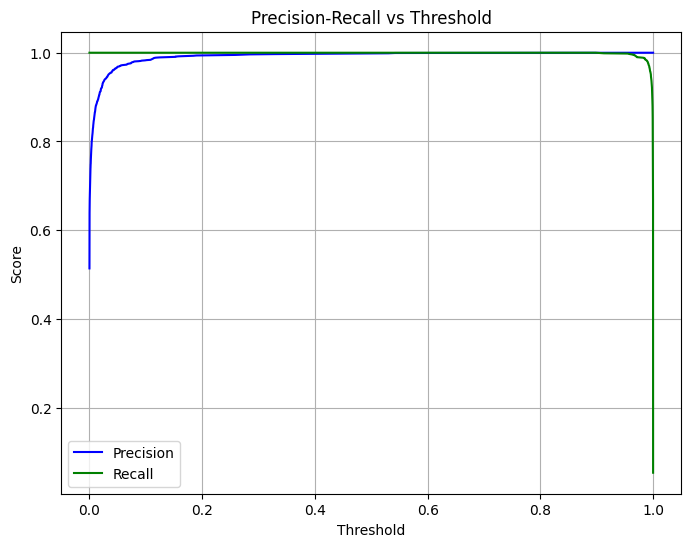

In [21]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

# # Get predicted probabilities from the model
# y_prob = binary_model.predict(binary_test_ds.map(lambda x, y: x))

# # Flatten labels
# y_true = np.concatenate([labels.numpy() for _, labels in binary_test_ds])

# Calculate precision, recall, and thresholds
precision, recall, thresholds = precision_recall_curve(y_true, predictions)

# Plot Precision-Recall Curve
plt.figure(figsize=(8, 6))
plt.plot(thresholds, precision[:-1], label='Precision', color='b')
plt.plot(thresholds, recall[:-1], label='Recall', color='g')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Precision-Recall vs Threshold')
plt.legend()
plt.grid()
plt.show()

In [23]:
from sklearn.metrics import f1_score

# Initialize variables
best_threshold = 0
best_f1 = 0

# Iterate over thresholds
for t in thresholds:
    y_pred = (predictions >= t).astype(int)
    f1 = f1_score(y_true, y_pred)
    if f1 > best_f1:
        best_f1 = f1
        best_threshold = t

print("Best Threshold:", best_threshold)
print("Best F1-Score:", best_f1)


Best Threshold: 0.8978374
Best F1-Score: 1.0


In [19]:
# # When evaluating, make sure shuffle is not applied explicitly
# y_true = []
# y_pred = []
    
for images, labels in binary_test_ds:
    predictions = binary_model.predict(images)
    y_true = np.concatenate([labels], axis=0) # True labels

# # Convert lists to numpy arrays
# y_true = np.array(y_true)
# y_pred = np.array(y_pred)

97/97 ━━━━━━━━━━━━━━━━━━━━ 60s 583ms/step
97/97 ━━━━━━━━━━━━━━━━━━━━ 58s 593ms/step


In [35]:
# Print confusion matrix and classification report
from sklearn.metrics import confusion_matrix, classification_report

y_pred = (predictions > 0.89).astype(int) # Predicted labels

cm = confusion_matrix(y_true, y_pred)
cr = classification_report(y_true, y_pred)

print("Confusion Matrix:\n", cm)
print("Classification Report:\n", cr)

Confusion Matrix:
 [[1509    0]
 [   0 1595]]
Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      1509
           1       1.00      1.00      1.00      1595

    accuracy                           1.00      3104
   macro avg       1.00      1.00      1.00      3104
weighted avg       1.00      1.00      1.00      3104



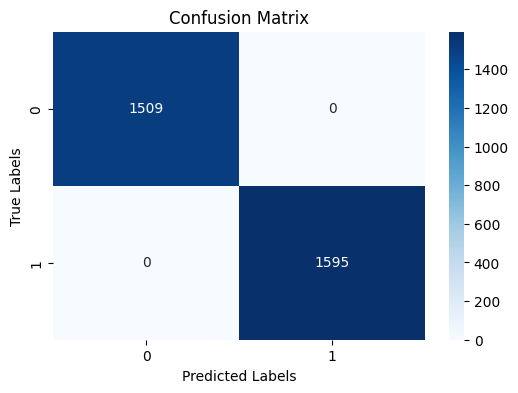

In [41]:
# Confusion matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

#### Multi Class Model Training

In [117]:
history_multiclass = multiclass_model.fit(
    multiclass_train_ds,
    validation_data=multiclass_val_ds,
    epochs=50,
    callbacks=[early_stopping, lr_scheduler]
)

Epoch 1/50
565/565 ━━━━━━━━━━━━━━━━━━━━ 8699s 15s/step - accuracy: 0.3533 - loss: 5.2587 - val_accuracy: 0.5999 - val_loss: 4.4703 - learning_rate: 1.0000e-05
Epoch 2/50
565/565 ━━━━━━━━━━━━━━━━━━━━ 7146s 13s/step - accuracy: 0.5370 - loss: 4.6210 - val_accuracy: 0.6808 - val_loss: 4.1839 - learning_rate: 1.0000e-05
Epoch 3/50
565/565 ━━━━━━━━━━━━━━━━━━━━ 7082s 13s/step - accuracy: 0.6010 - loss: 4.3819 - val_accuracy: 0.6983 - val_loss: 4.0495 - learning_rate: 1.0000e-05
Epoch 4/50
565/565 ━━━━━━━━━━━━━━━━━━━━ 7077s 13s/step - accuracy: 0.6326 - loss: 4.2163 - val_accuracy: 0.7345 - val_loss: 3.8952 - learning_rate: 1.0000e-05
Epoch 5/50
565/565 ━━━━━━━━━━━━━━━━━━━━ 7046s 12s/step - accuracy: 0.6641 - loss: 4.0766 - val_accuracy: 0.7474 - val_loss: 3.8116 - learning_rate: 1.0000e-05
Epoch 6/50
565/565 ━━━━━━━━━━━━━━━━━━━━ 7210s 13s/step - accuracy: 0.6818 - loss: 3.9562 - val_accuracy: 0.7562 - val_loss: 3.7103 - learning_rate: 1.0000e-05
Epoch 7/50
565/565 ━━━━━━━━━━━━━━━━━━━━ 8738s 

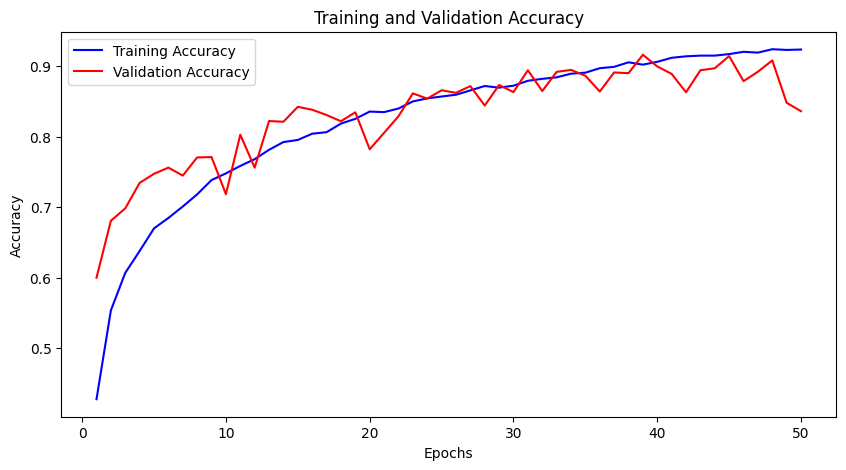

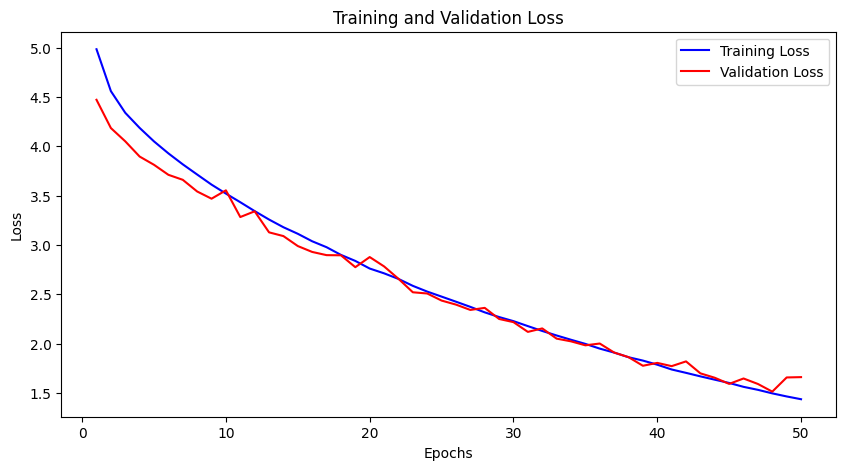

In [119]:
# Extract metrics from the history object
acc = history_multiclass.history['accuracy']
val_acc = history_multiclass.history['val_accuracy']
loss = history_multiclass.history['loss']
val_loss = history_multiclass.history['val_loss']

# Create line plots
epochs = range(1, len(acc) + 1)

# Plot Accuracy
plt.figure(figsize=(10, 5))
plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot Loss
plt.figure(figsize=(10, 5))
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [125]:
# Evaluate on test data
test_loss, test_accuracy = multiclass_model.evaluate(multiclass_test_ds)
print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

122/122 ━━━━━━━━━━━━━━━━━━━━ 291s 2s/step - accuracy: 0.9194 - loss: 1.4999
Test Loss: 1.5174
Test Accuracy: 0.9098


In [129]:
# Get true labels and predictions
y_true = []
y_pred = []

for images, labels in multiclass_test_ds:
    y_true.append(np.argmax(labels.numpy(), axis=1))  # One-hot to class index
    y_pred.append(np.argmax(multiclass_model.predict(images), axis=1))

# Flatten lists
y_true = np.concatenate(y_true)
y_pred = np.concatenate(y_pred)

# Print classification report
class_names = [f"Class {i}" for i in range(8)]  # Replace with actual class names if available
report = classification_report(y_true, y_pred, target_names=class_names)
print(report)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 

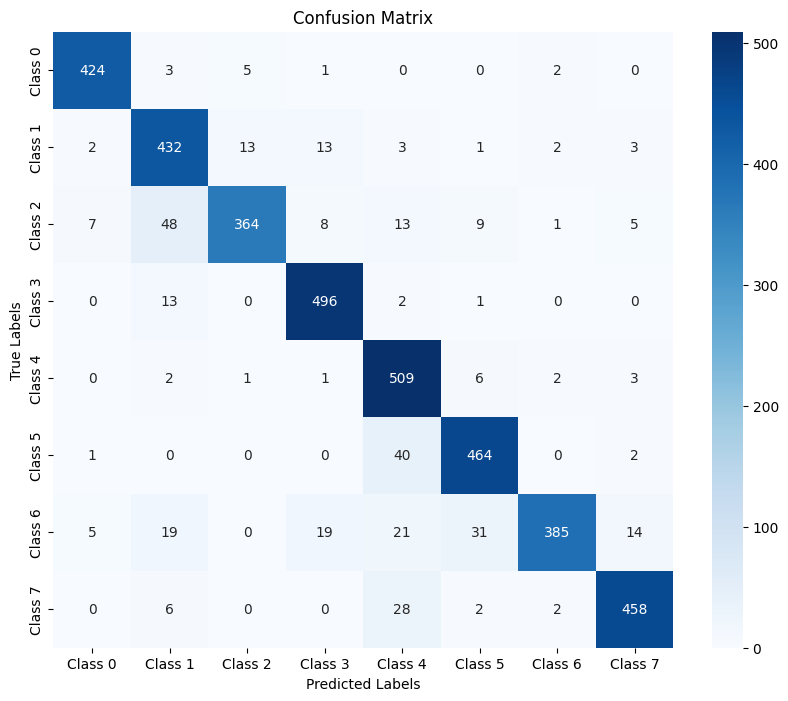

In [174]:
# Confusion matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()

In [164]:
# List folder names
class_name = os.listdir(merged_dir_subclass)
class_name.sort()  # Sort alphabetically to mimic TensorFlow's behavior
print(class_name)

['b_adenosis', 'b_fibroadenoma', 'b_phyllodes_tumor', 'b_tubular_adenoma', 'm_ductal_carcinoma', 'm_lobular_carcinoma', 'm_mucinous_carcinoma', 'm_papillary_carcinoma']


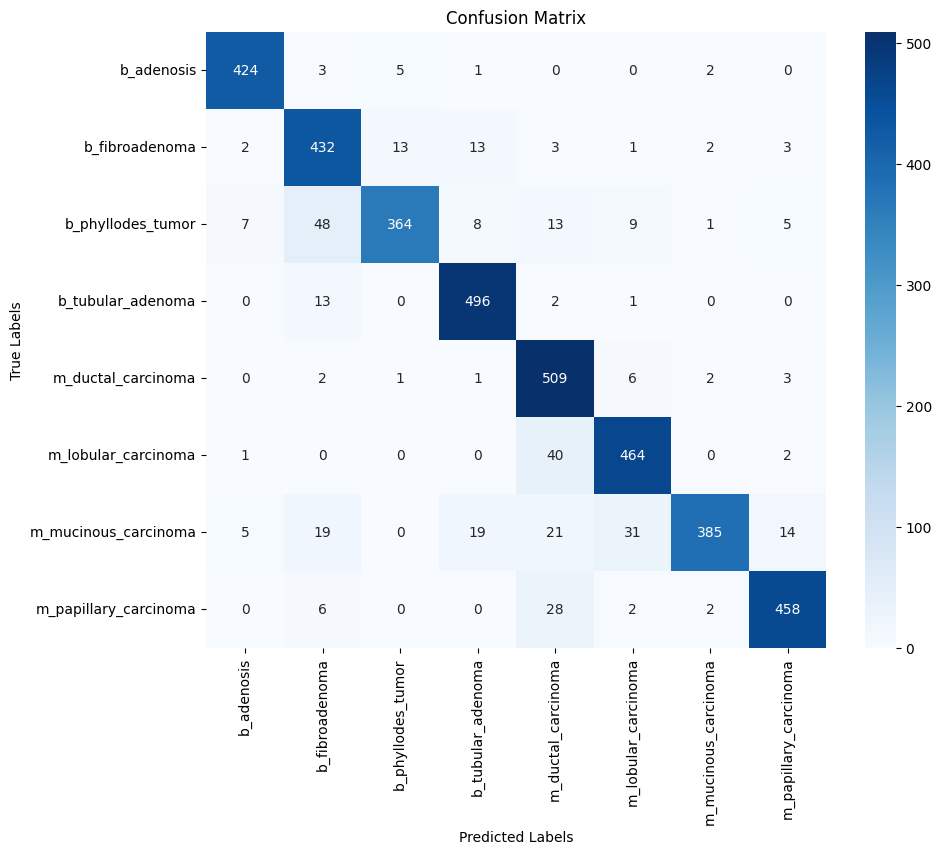

In [172]:
# Confusion matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_name, yticklabels=class_name)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()